<a href="https://colab.research.google.com/github/AmiltonFerreira/COVID-19/blob/main/COVID_19_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img alt="Colaboratory logo" width="100%" src="https://github.com/AmiltonFerreira/data_science/blob/main/banner.png?raw=true">

#An analysis of the COVID-19 pandemic in South America
*by Amilton Ferreira, Data Scientist*

<br>
The COVID-19 pandemic was a tragic episode in recent world history. It is estimated that more than 6 million people will have died from this disease by the end of 2022. The last epidemic of this magnitude, the Spanish flu, occurred about 100 years ago.

Since then, the world has evolved significantly. One of the advances that can be highlighted is the capacity to generate, store, and transmit data. This power allowed us to monitor the progression of the pandemic in real-time in all regions of the globe.

Almost 4 years after the start of the pandemic, we can analyze the data obtained over this period and try to extract important information and lessons that can generate lessons that will help us to deal with similar situations in the future.

<br>

<center><img alt="Image" width="60%" src="https://github.com/AmiltonFerreira/COVID-19/blob/main/Images/martin-sanchez-Tzoe6VCvQYg-unsplash.jpeg?raw=true"> <figcaption>Photo by <a href="https://unsplash.com/@martinsanchez?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Martin Sanchez</a> on <a href="https://unsplash.com/photos/Tzoe6VCvQYg?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText">Unsplash</a>
  </figcaption> </center>

<br>

This analysis will be limited to the countries of South America, and their data between the years 2020 and 2022. Considering this small group of countries, with reasonably similar political, economic, social, and geographic conditions, we will be able to make more appropriate comparisons.

The data was extracted from the database of [Our World in Data](https://ourworldindata.org/), a "project of the Global Change Data Lab, a non-profit organization based in the United Kingdom (Registered Charity Number 1186433)", with the mission to publish the "research and data to make progress against the world's largest problems".

Given the size of the database explored, we will divide this analysis into 6 parts.

We will analyze separately the aspects related to the number of registered cases of COVID-19, the records of deaths related to the pandemic, vaccination, hospitalization, and some socioeconomic characteristics of the countries, and at the end some considerations will be presented.

The data presented in this article were treated with the sole objective of better understanding the evolution of the pandemic. The author does not intend to emphasize any kind of political bias.

Without any further ado, let's go to the data.

## Obtaining Data


At first, it's necessary to import the libraries that will be used. **Pandas** is an open-source library to work with data structures and data analysis tools for the Python programming language. **Matplotlib** and **Seaborn** are used for plotting, creating graphics, and working with figures. **NumPy** that gives support for large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays. **Missingno** allows quick visualizations of missing data. And **Datetime** supplies classes for manipulating dates and times.


In [1]:
# import the necessary libraries
import pandas as pd
import missingno
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
import datetime
import matplotlib.ticker as ticker
import seaborn as sns
import matplotlib.animation as animation

Then import the ".csv" file with the data that will be explored. In this case, the file was previously downloaded from the GitHub repository managed by **Our World in Data**.

In [2]:
# import the file ".csv" as a DataFrame
df = pd.read_csv('owid-covid-data_7jul23.csv')

## Exploratory Data Analysis (EDA)


### **Preview data**

**Preliminary Data Processing**


At first, we will filter the file according to the scope already defined for this search.

In [3]:
# limit the file to the predefined scope
df = df.loc[df['continent'] == 'South America']
df = df[(df['date'] >= '2020-01-01') & (df['date'] <= '2022-12-31')]

We shall read our dataset and generate a simple preview and statistics of the data.

In [4]:
# general information about the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15318 entries, 11520 to 314640
Data columns (total 67 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   iso_code                                    15318 non-null  object 
 1   continent                                   15318 non-null  object 
 2   location                                    15318 non-null  object 
 3   date                                        15318 non-null  object 
 4   total_cases                                 14378 non-null  float64
 5   new_cases                                   15309 non-null  float64
 6   new_cases_smoothed                          15234 non-null  float64
 7   total_deaths                                13172 non-null  float64
 8   new_deaths                                  15315 non-null  float64
 9   new_deaths_smoothed                         15245 non-null  float64
 10  total

**Duplicated Entries**

Looking for duplicated entries is also a necessary step to avoid wrong conclusions.

In [5]:
# check for duplicated entries
df.duplicated().sum()

0

There are no duplicated entries in this Data Frame.

The Data Frame is composed of 15318 entries (lines) with 67 attributes (variables or columns).

Some of the attributes have a high percentage of null values. We will define later which ones will be disregarded in this analysis.

Also, there are three attributes that must be converted in order to facilitate the research.

In [6]:
# set as categorical data
df.location = df.location.astype('category')
df.tests_units = df.tests_units.astype('category')
# set as datetime data
df.date = pd.to_datetime(df.date)

In [7]:
# show the first 5 entries of the DataFrame
pd.set_option('display.max_columns', None)
df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
11520,ARG,South America,Argentina,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,4.0,0.000,0.000,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,16.177,31.9,11.198,7.441,18933.907,0.6,191.032,5.5,16.2,27.7,NaN,5.0,76.67,0.845,45510324.0,NaN,NaN,NaN,NaN
11521,ARG,South America,Argentina,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,99.0,95.0,0.002,0.002,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,16.177,31.9,11.198,7.441,18933.907,0.6,191.032,5.5,16.2,27.7,NaN,5.0,76.67,0.845,45510324.0,NaN,NaN,NaN,NaN
11522,ARG,South America,Argentina,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,104.0,5.0,0.002,0.000,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,16.177,31.9,11.198,7.441,18933.907,0.6,191.032,5.5,16.2,27.7,NaN,5.0,76.67,0.845,45510324.0,NaN,NaN,NaN,NaN
11523,ARG,South America,Argentina,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180.0,76.0,0.004,0.002,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,16.177,31.9,11.198,7.441,18933.907,0.6,191.032,5.5,16.2,27.7,NaN,5.0,76.67,0.845,45510324.0,NaN,NaN,NaN,NaN
11524,ARG,South America,Argentina,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,194.0,14.0,0.004,0.000,NaN,NaN,NaN,NaN,tests performed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,16.177,31.9,11.198,7.441,18933.907,0.6,191.032,5.5,16.2,27.7,NaN,5.0,76.67,0.845,45510324.0,NaN,NaN,NaN,NaN


In [8]:
# show the last 5 entries of the DataFrame
df.tail()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
314636,VEN,South America,Venezuela,2022-12-27,550126.0,57.0,131.286,5830.0,0.0,0.000,19437.914,2.014,4.639,205.995,0.000,0.000,1.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.89,36.253,29.0,6.614,3.915,16745.022,NaN,204.85,6.47,NaN,NaN,NaN,0.8,72.06,0.711,28301700.0,NaN,NaN,NaN,NaN
314637,VEN,South America,Venezuela,2022-12-28,550146.0,20.0,124.714,5830.0,0.0,0.000,19438.620,0.707,4.407,205.995,0.000,0.000,1.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.89,36.253,29.0,6.614,3.915,16745.022,NaN,204.85,6.47,NaN,NaN,NaN,0.8,72.06,0.711,28301700.0,NaN,NaN,NaN,NaN
314638,VEN,South America,Venezuela,2022-12-29,550219.0,73.0,120.143,5830.0,0.0,0.000,19441.200,2.579,4.245,205.995,0.000,0.000,1.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.89,36.253,29.0,6.614,3.915,16745.022,NaN,204.85,6.47,NaN,NaN,NaN,0.8,72.06,0.711,28301700.0,NaN,NaN,NaN,NaN
314639,VEN,South America,Venezuela,2022-12-30,550319.0,100.0,110.143,5831.0,1.0,0.143,19444.733,3.533,3.892,206.030,0.035,0.005,1.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.89,36.253,29.0,6.614,3.915,16745.022,NaN,204.85,6.47,NaN,NaN,NaN,0.8,72.06,0.711,28301700.0,NaN,NaN,NaN,NaN
314640,VEN,South America,Venezuela,2022-12-31,550388.0,69.0,101.286,5831.0,0.0,0.143,19447.171,2.438,3.579,206.030,0.000,0.005,1.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.89,36.253,29.0,6.614,3.915,16745.022,NaN,204.85,6.47,NaN,NaN,NaN,0.8,72.06,0.711,28301700.0,NaN,NaN,NaN,NaN


The first and last 5 entries shows that the data is aparently correctly structured in the Data Frame.


Given the size of the database explored, we will divide this analysis into 6 parts.

We will analyze separately the aspects related to the number of registered cases of COVID-19, the records of deaths related to the pandemic, data on vaccination, hospitalization, some socioeconomic characteristics of the countries, and at the end some considerations will be presented.

#Cases and tests



Let's take a closer look at the data on COVID-19 cases and tests. By analyzing the records, we can see how the virus spread and how effective the testing efforts were.

First, we select the attributes that will be analyzed in this part of the research.

In [9]:
# selecting the attributes
df_cases = df[['location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units']]

### Variables dictionary

* `location` -	Geographical location
* `date`	- Date of observation
* `total_cases` - Total confirmed cases of COVID-19. Counts can include probable cases, where reported.
* `new_cases` -	New confirmed cases of COVID-19. Counts can include probable cases, where reported. In rare cases where our source reports a negative daily change due to a data correction, this metric was set to NA.
* `new_cases_smoothed` -	New confirmed cases of COVID-19 (7-day smoothed). Counts can include probable cases, where reported.
* `total_cases_per_million`	- Total confirmed cases of COVID-19 per 1,000,000 people. Counts can include probable cases, where reported.
* `new_cases_per_million`-	New confirmed cases of COVID-19 per 1,000,000 people. Counts can include probable cases, where reported.
* `new_cases_smoothed_per_million`	- New confirmed cases of COVID-19 (7-day smoothed) per 1,000,000 people. Counts can include probable cases, where reported.
* `total_tests` - Total tests for COVID-19.
* `new_tests` - New tests for COVID-19 (only calculated for consecutive days).
* `total_tests_per_thousand` - Total tests for COVID-19 per 1,000 people.
* `new_tests_per_thousand` - New tests for COVID-19 per 1,000 people.
* `new_tests_smoothed_per_thousand` - New tests for COVID-19 (7-day smoothed) per 1,000 people.
* `positive_rate` - The share of COVID-19 tests that are positive, given as a rolling 7-day average (this is the inverse of tests_per_case).
* `tests_per_case` - Tests conducted per new confirmed case of COVID-19, given as a rolling 7-day average (this is the inverse of positive_rate).
* `tests_units` - Units used by the location to report its testing data. A country file can't contain mixed units. All metrics concerning testing data use the specified test unit. Valid units are 'people tested' (number of people tested), 'tests performed' (number of tests performed. a single person can be tested more than once in a given day) and 'samples tested' (number of samples tested. In some cases, more than one sample may be required to perform a given test).




### Data cleaning


**Missing values**

Now we are going to check where exactly in this new Data Frame are the missing or nonvalid data.

In [10]:
# variables sorted by the percentage of their missing values
pd.set_option('display.max_rows', None) # setting max row to show all attributes
(df_cases.isnull().sum() / df_cases.shape[0]).sort_values(ascending=False)

new_tests                          0.609283
new_tests_per_thousand             0.609283
tests_per_case                     0.566523
positive_rate                      0.565674
total_tests                        0.553597
total_tests_per_thousand           0.553597
new_tests_smoothed_per_thousand    0.476107
new_tests_smoothed                 0.476107
tests_units                        0.471080
total_cases_per_million            0.061366
total_cases                        0.061366
new_cases_smoothed_per_million     0.005484
new_cases_smoothed                 0.005484
new_cases_per_million              0.000588
new_cases                          0.000588
date                               0.000000
location                           0.000000
dtype: float64

In [11]:
pd.set_option('display.max_rows', 10) # setting max row to 10 again

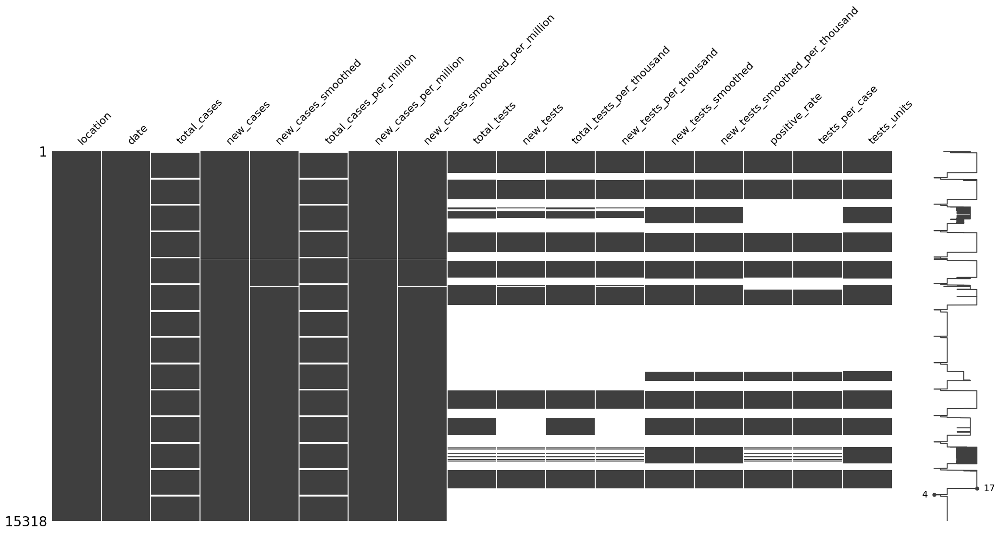

In [12]:
# generates a visualization of the entries with null values
missingno.matrix(df_cases)
plt.show()

Some attributes, such as `new_tests`, have a high absence rate. Possibly countries that started this registration late or that didn't do it at all.

In [13]:
# countries with less information on new test
df_info = []
for country in df_cases.location.unique():
  df_tmp = df_cases.loc[df_cases['location'] == country]
  null_value = (df_tmp['new_tests'].isnull().sum() / df_tmp.shape[0])
  df_info.append(
          {
              'Country': country,
              'New_tests_null': null_value,
          }
      )

df_info = pd.DataFrame(df_info)
pd.set_option('display.max_rows', 14)
df_info.sort_values('New_tests_null', ascending=False, ignore_index=True)

,Country,New_tests_null
0,Falkland Islands,1.000000
1,French Guiana,1.000000
2,Guyana,1.000000
3,Peru,1.000000
4,Venezuela,1.000000
5,Suriname,0.798903
6,Brazil,0.757770
7,Colombia,0.364717
8,Paraguay,0.323583
9,Uruguay,0.308958


It is noted that the Falkland Islands, French Guiana, Guyana, Peru, Venezuela, Suriname, and Brazil have a high absence rate in relation to information about the tests. With regard to countries that have a rate different from 1, it may be that they took a while to start collecting data.

For now, we will not eliminate these countries from the analysis at this time. In the series of graphs, we can better understand this situation.

### Time series


At this point, we are going to look into the time series of the data from each country.

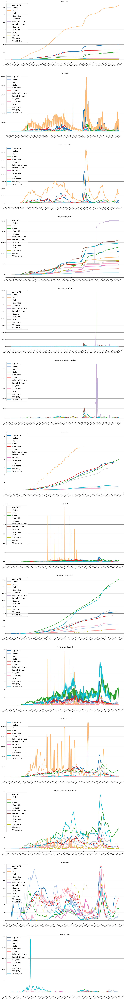

In [14]:
# creating the plots
fig, axs = plt.subplots(14, 1, figsize = (20,168)) # adjust the the position of the plots
colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate graphs
i = 0
n = 0
for col in range(2, 16):
  for country in df_cases.location.unique():
    axs[n].plot(df_cases.loc[df_cases['location'] == country].date,
                df_cases.loc[df_cases['location'] == country].iloc[:,[col]],
                label = country, c = colors[i], linewidth=3)
    i+=1
  axs[n].set_title(df_cases.columns[col])
  axs[n].legend(fontsize = 'xx-large', loc = 'upper left')
  # Text in the x-axis will be displayed in 'YYYY-mm' format.
  axs[n].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
  axs[n].xaxis.set_major_locator(mdates.MonthLocator())

  axs[n].spines['top'].set_visible(False)
  axs[n].spines['right'].set_visible(False)
  axs[n].spines['left'].set_visible(False)

  axs[n].yaxis.grid(True, color ="gray") #grid based on y axis
  axs[n].set_facecolor("white") #backgroud color

  # Rotates and right-aligns the x labels so they don't crowd each other.
  for label in axs[n].get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')
  i=0
  n+=1

plt.show()

From this quick and simple exposition of the data, we can more easily select the information in which we will go deeper.

Starting with **Total Cases**.

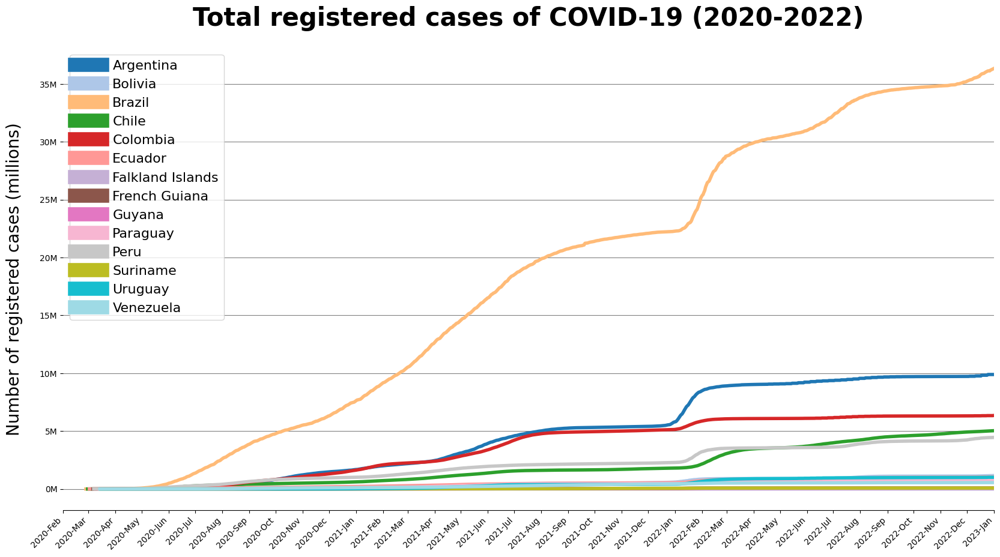

In [15]:
# Plotting Total cases

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country

i=0 # variable to count during the for loop
custom_lines = []
for country in df_cases.location.unique(): # data that will be ploted
  ax.plot(df_cases.loc[df_cases['location'] == country].date,
              df_cases.loc[df_cases['location'] == country].total_cases,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

ax.legend(custom_lines, df_cases['location'].unique(), fontsize = 16)

ax.set_title("Total registered cases of COVID-19 (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)

# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])


ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x/1000000)) + 'M'))

# label x-axis and y-axis
ax.set_ylabel('Number of registered cases (millions)', fontsize = '20', labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')
ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

Based on this graph, Brazil had the highest number of confirmed COVID-19 cases, followed at distance by Argentina, Colombia, Peru, and Chile. This is an expected output, given that they have the largest populations on the Continent. To have a more proportional comparison, we must analyze the total cases per million.

We can also observe, through the slope of the curves on the plot, the moments of greatest increase in the number of cases, with the period from **January to March 2021** being the most pronounced.

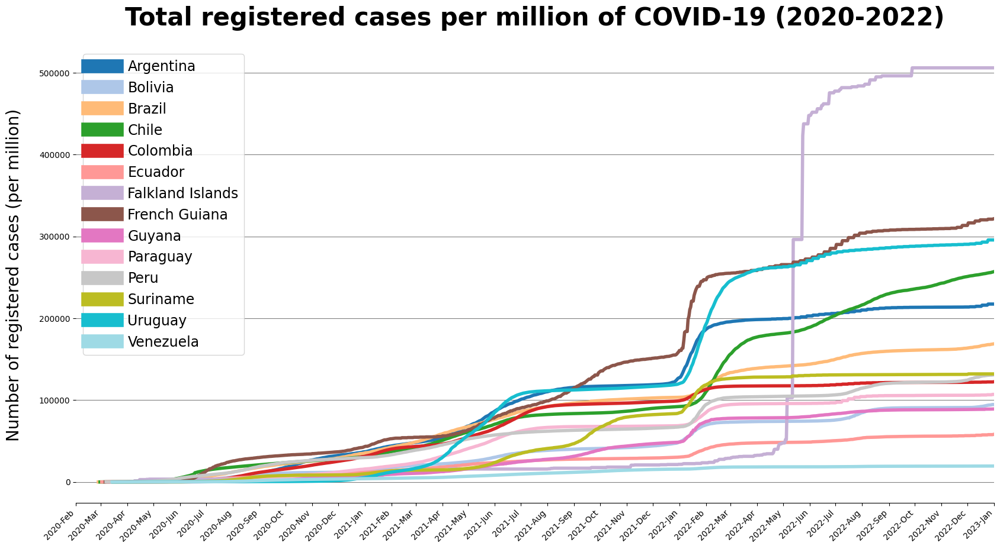

In [16]:
# Plotting Total cases per million

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country

i=0 # variable to count during the for loop
custom_lines = []
for country in df_cases.location.unique(): # data that will be ploted
  ax.plot(df_cases.loc[df_cases['location'] == country].date,
              df_cases.loc[df_cases['location'] == country].total_cases_per_million,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

ax.legend(custom_lines, df_cases['location'].unique(), fontsize = 17)

ax.set_title("Total registered cases per million of COVID-19 (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)

# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x))))

# label x-axis and y-axis
ax.set_ylabel('Number of registered cases (per million)', fontsize = '20', labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')

ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

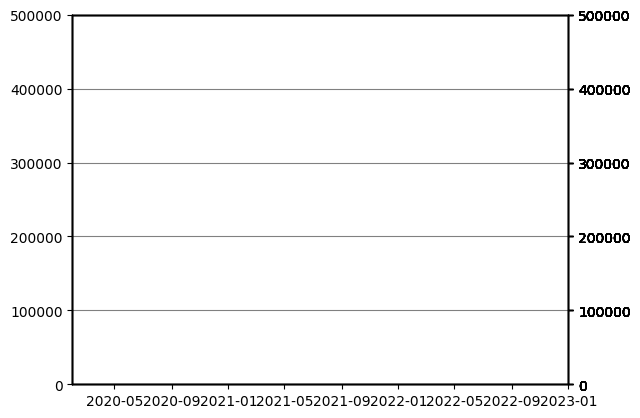

In [17]:
# Total cases per million - animated plot

def updateline(num, data1, line1, data2, line2, data3, line3, data4, line4,
                    data5, line5, data6, line6, data7, line7, data8, line8,
                    data9, line9, data10, line10, data11, line11,
                    data12, line12, data13, line13, data14, line14):

    line1.set_data(data1[..., :num])
    line2.set_data(data2[..., :num])
    line3.set_data(data3[..., :num])
    line4.set_data(data4[..., :num])
    line5.set_data(data5[..., :num])
    line6.set_data(data6[..., :num])
    line7.set_data(data7[..., :num])
    line8.set_data(data8[..., :num])
    line9.set_data(data9[..., :num])
    line10.set_data(data10[..., :num])
    line11.set_data(data11[..., :num])
    line12.set_data(data12[..., :num])
    line13.set_data(data13[..., :num])
    line14.set_data(data14[..., :num])

    time_text.set_text("Points: %.0f" % int(num))

    return (line1, line2, line3, line4, line5, line6, line7,
            line8, line9, line10, line11,line12, line13, line14)


for i, country in zip(range(1,15),df_cases.location.unique()):
  globals()[f'data{i}'] = np.array([list(df_cases.loc[df_cases['location'] == country].date),
              list(df_cases.loc[df_cases['location'] == country].total_cases_per_million)])

# setup the formatting for moving files
Writer = animation.writers['ffmpeg']
Writer = Writer(fps=10, metadata=dict(artist="Me"), bitrate=-1)

colors = plt.cm.tab20(np.linspace(0, 1, 14))

fig = plt.figure()
ax1 = fig.add_subplot(111)
line1, = ax1.plot([], [], c = colors[0], label=df_cases.location.unique()[0])
ax1.set_ylim(0, 500000)
ax1.set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])
ax1.set_facecolor("white")
ax1.yaxis.grid(True, color ="gray")

for i in range(2,15):
  globals()[f'ax{i}'] = ax1.twinx()
  globals()[f'line{i}'], = globals()[f'ax{i}'].plot([], [], c = colors[i-1], label=df_cases.location.unique()[i-1])
  globals()[f'ax{i}'].set_ylim(0, 500000)
  globals()[f'ax{i}'].set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])

time_text = ax.text(0.1, 0.95, "", transform=ax.transAxes,
                    fontsize=15, color='red')

line_animation = animation.FuncAnimation(fig, updateline,
                                         frames = len(df_cases.loc[df_cases['location'] == 'Argentina'].date.index),
                                         fargs=(data1, line1, data2, line2, data3, line3, data4, line4,
                                                data5, line5, data6, line6, data7, line7, data8, line8,
                                                data9, line9, data10, line10, data11, line11,
                                                data12, line12, data13, line13, data14, line14,))

#line_animation.save("Covid_total_cases_per_million.mp4", writer=Writer)

In [18]:
# Total cases per million - Bar chart race

#Setting up the Dataframe to create the Bar chart race
df_temp_complete = pd.DataFrame()
for country in df_cases.location.unique():
  df_temp = (pd.DataFrame(df_cases.loc[df_cases['location'] == country].total_cases_per_million).reset_index()).drop(['index'], axis=1).T
  df_temp.insert(0,'Country', country )
  df_temp_complete = pd.concat([df_temp_complete, df_temp], ignore_index = True)
  df_temp_complete.reset_index()

df_date = pd.DataFrame(df_cases.loc[df_cases['location'] == 'Argentina'].date.reset_index()).drop(['index'], axis=1)
df_date['date'] = df_date['date'].dt.strftime('%d %b %Y')
df_date = df_date.T
df_date.insert(0,'Country', 'Date')

df_temp_complete = pd.concat([df_date, df_temp_complete], ignore_index = True)

df_temp_complete.to_csv('bar_chart_total_cases_per_million.csv',header=False, index=False)


The [bar chart race](https://www.youtube.com/watch?v=eb5C6dCDwgw) was created with Flourish.



The bar chart race shows that the Falklands Islands, French Guiana, and Uruguay had the highest rates of total cases per million in the studied period. Venezuela and Ecuador had the lowest rates.

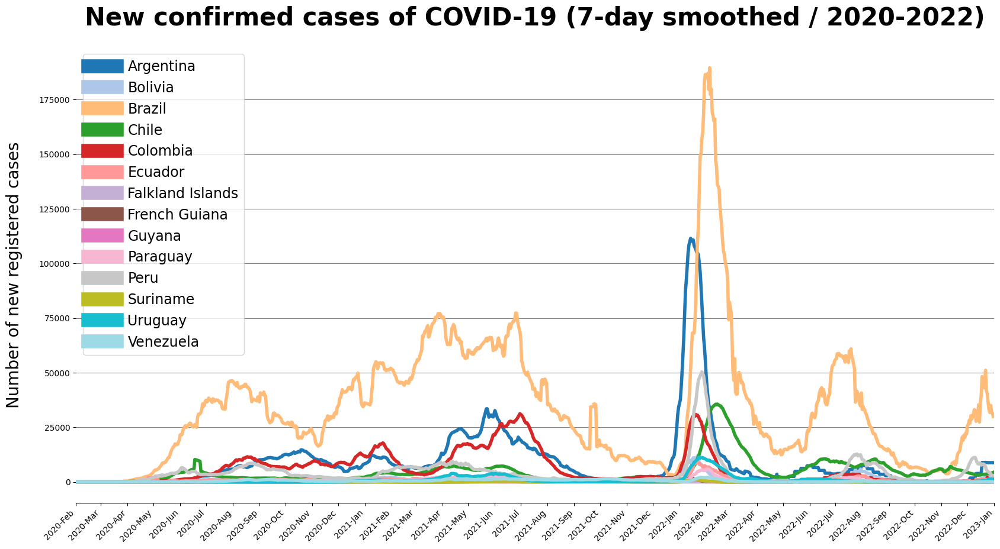

In [19]:
# Plotting new cases smoothed

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country

i=0 # variable to count during the for loop
custom_lines = []
for country in df_cases.location.unique(): # data that will be ploted
  ax.plot(df_cases.loc[df_cases['location'] == country].date,
              df_cases.loc[df_cases['location'] == country].new_cases_smoothed,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

ax.legend(custom_lines, df_cases['location'].unique(), fontsize = 17)

ax.set_title("New confirmed cases of COVID-19 (7-day smoothed / 2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)


# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x))))

# label x-axis and y-axis
ax.set_ylabel('Number of new registered cases', fontsize = '20', labelpad=20)
#ax.set_xlabel('Date', fontsize = 20, labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')

ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

Reading this graph, we were able to observe some peaks in the number of cases, the most relevant occurring between December 2021 and May 2022. This sudden behavior corroborates the observed increase of the slope on the curves of the total registered cases graph.

Now, for the testing data, at first, it's necessary to separate the countries by the metric utilized on the testing data: 'tests performed' or 'people tested'. It is worth mentioning that the database does not have testing data from the following countries: Venezuela, French Guiana, and Falkland Islands.

In [20]:
for country in df_cases.location.unique():
  print(country)
  print(df_cases.loc[df_cases['location'] == country].tests_units.unique())

Argentina
['tests performed', NaN]
Categories (2, object): ['people tested', 'tests performed']
Bolivia
[NaN, 'tests performed']
Categories (2, object): ['people tested', 'tests performed']
Brazil
[NaN, 'tests performed']
Categories (2, object): ['people tested', 'tests performed']
Chile
[NaN, 'tests performed']
Categories (2, object): ['people tested', 'tests performed']
Colombia
[NaN, 'tests performed']
Categories (2, object): ['people tested', 'tests performed']
Ecuador
[NaN, 'people tested']
Categories (2, object): ['people tested', 'tests performed']
Falkland Islands
[NaN]
Categories (2, object): ['people tested', 'tests performed']
French Guiana
[NaN]
Categories (2, object): ['people tested', 'tests performed']
Guyana
[NaN, 'tests performed']
Categories (2, object): ['people tested', 'tests performed']
Paraguay
[NaN, 'tests performed']
Categories (2, object): ['people tested', 'tests performed']
Peru
[NaN, 'tests performed']
Categories (2, object): ['people tested', 'tests perfor


Ecuador and Uruguay were the only countries that used the "tested people" parameter in their records. The other countries used the number of "tests performed".

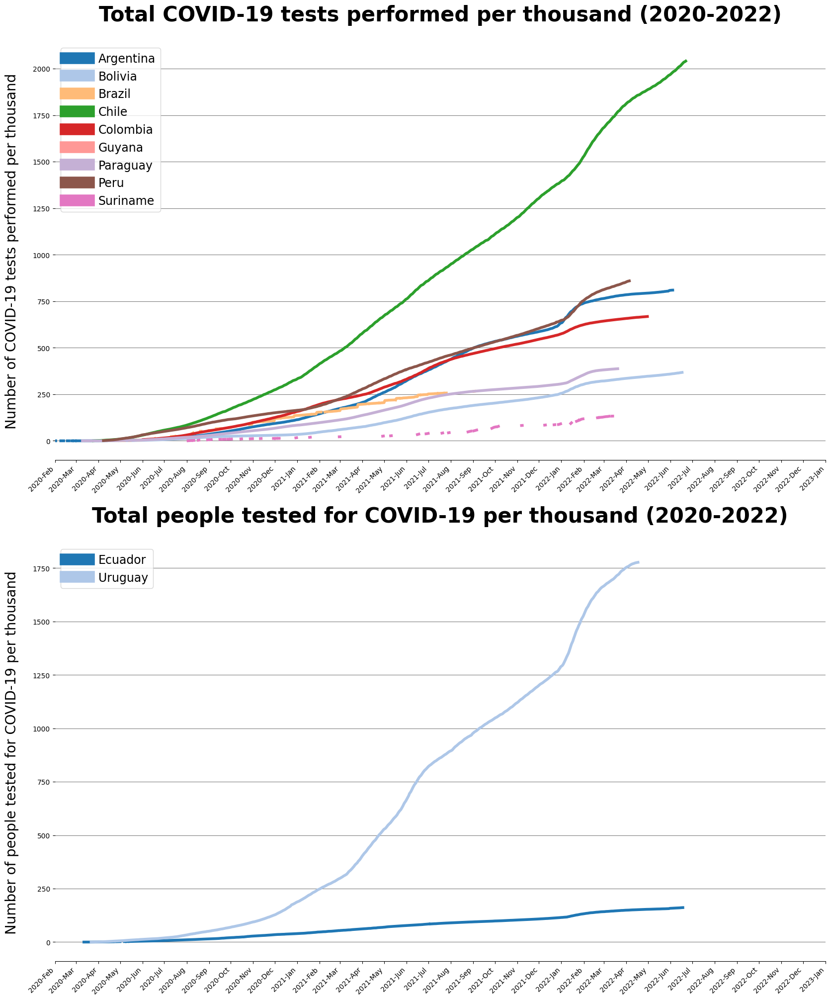

In [21]:
fig, axs = plt.subplots(2, 1, figsize = (20,24)) # adjust the the position of the plots


colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate graphs

i=0 # variable to count during the for loop
custom_lines = []

group_tests_performed = list(df_cases.location.unique())
group_tests_performed.remove('Ecuador')
group_tests_performed.remove('Uruguay')
# countries without test data
group_tests_performed.remove('Venezuela')
group_tests_performed.remove('French Guiana')
group_tests_performed.remove('Falkland Islands')
i=0

for country in group_tests_performed: # data that will be ploted
  axs[0].plot(df_cases.loc[df_cases['location'] == country].date,
              df_cases.loc[df_cases['location'] == country].total_tests_per_thousand,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

group_people_tested = ['Ecuador', 'Uruguay']
i=0


for country in group_people_tested: # data that will be ploted
  axs[1].plot(df_cases.loc[df_cases['location'] == country].date,
              df_cases.loc[df_cases['location'] == country].total_tests_per_thousand,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1


for n in [0,1]:
  axs[n].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b')) # Text in the x-axis will be displayed in 'YYYY-mm' format.

  axs[n].xaxis.set_major_locator(mdates.MonthLocator())
  axs[n].set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])
  axs[n].yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x))))
  # Rotates and right-aligns the x labels so they don't crowd each other.
  for label in axs[n].get_xticklabels(which='major'):
    label.set(rotation=45, horizontalalignment='right')
  axs[n].set_facecolor("white")
  axs[n].spines['top'].set_visible(False)
  axs[n].spines['right'].set_visible(False)
  axs[n].spines['left'].set_visible(False)
  axs[n].yaxis.grid(True, color ="gray")

axs[0].legend(custom_lines, group_tests_performed, fontsize = 17, loc = 'upper left')
axs[1].legend(custom_lines, group_people_tested, fontsize = 17, loc = 'upper left')

# label x-axis and y-axis
axs[0].set_title("Total COVID-19 tests performed per thousand (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)
axs[0].set_ylabel('Number of COVID-19 tests performed per thousand', fontsize = '20', labelpad=20)
axs[1].set_title("Total people tested for COVID-19 per thousand (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)
axs[1].set_ylabel('Number of people tested for COVID-19 per thousand', fontsize = '20', labelpad=20)



plt.show()

**Uruguay** and **Chile** were the countries that stood out in their respective categories. These countries also had a high rate of cases per million, with the 3rd and 4th position in South America, by the end of 2022.

**Bolivia** and **Ecuador**, on the other hand, had low testing rates and ended 2022 in the bottom third of countries in terms of the number of cases per million.

There is a strong correlation between these two parameters (0.84). However, it is difficult to imply, based solely on these data, causality. There is no way to say, with the data in hand, that the high number of registered cases is a consequence of high testing rates or whether the demand for more tests came from more people feeling the symptoms of COVID-19.

## Correlations

In [77]:
# correlation matrix
corr = df_cases.corr(method ='spearman')

display(corr)

<ipython-input-77-0cbe589c2468>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df_cases.corr(method ='spearman')


,total_cases,new_cases,new_cases_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case
total_cases,1.000000,0.598430,0.779295,0.599224,0.317529,0.328607,0.969872,0.784022,0.721948,0.402265,0.832406,0.374516,-0.047049,0.052814
new_cases,0.598430,1.000000,0.884097,0.054577,0.844423,0.605690,0.601323,0.798413,0.301163,0.469827,0.833207,0.423886,0.459156,-0.458311
new_cases_smoothed,0.779295,0.884097,1.000000,0.233588,0.686776,0.694387,0.651405,0.824220,0.337403,0.465935,0.865346,0.425621,0.483238,-0.481763
total_cases_per_million,0.599224,0.054577,0.233588,1.000000,0.081920,0.331532,0.798941,0.558282,0.921266,0.573597,0.440121,0.449141,-0.153826,0.159948
new_cases_per_million,0.317529,0.844423,0.686776,0.081920,1.000000,0.761020,0.363191,0.593267,0.323523,0.617251,0.481955,0.540459,0.559314,-0.559983
new_cases_smoothed_per_million,0.328607,0.605690,0.694387,0.331532,0.761020,1.000000,0.401934,0.613934,0.355247,0.623250,0.500405,0.558076,0.600642,-0.600830
total_tests,0.969872,0.601323,0.651405,0.798941,0.363191,0.401934,1.000000,0.840798,0.824998,0.552082,0.862383,0.606972,-0.207781,0.214685
new_tests,0.784022,0.798413,0.824220,0.558282,0.593267,0.613934,0.840798,1.000000,0.648132,0.730352,0.966233,0.743458,0.020300,-0.017259
total_tests_per_thousand,0.721948,0.301163,0.337403,0.921266,0.323523,0.355247,0.824998,0.648132,1.000000,0.736202,0.627717,0.770182,-0.312452,0.320258
new_tests_per_thousand,0.402265,0.469827,0.465935,0.573597,0.617251,0.623250,0.552082,0.730352,0.736202,1.000000,0.665825,0.937260,-0.083741,0.085497


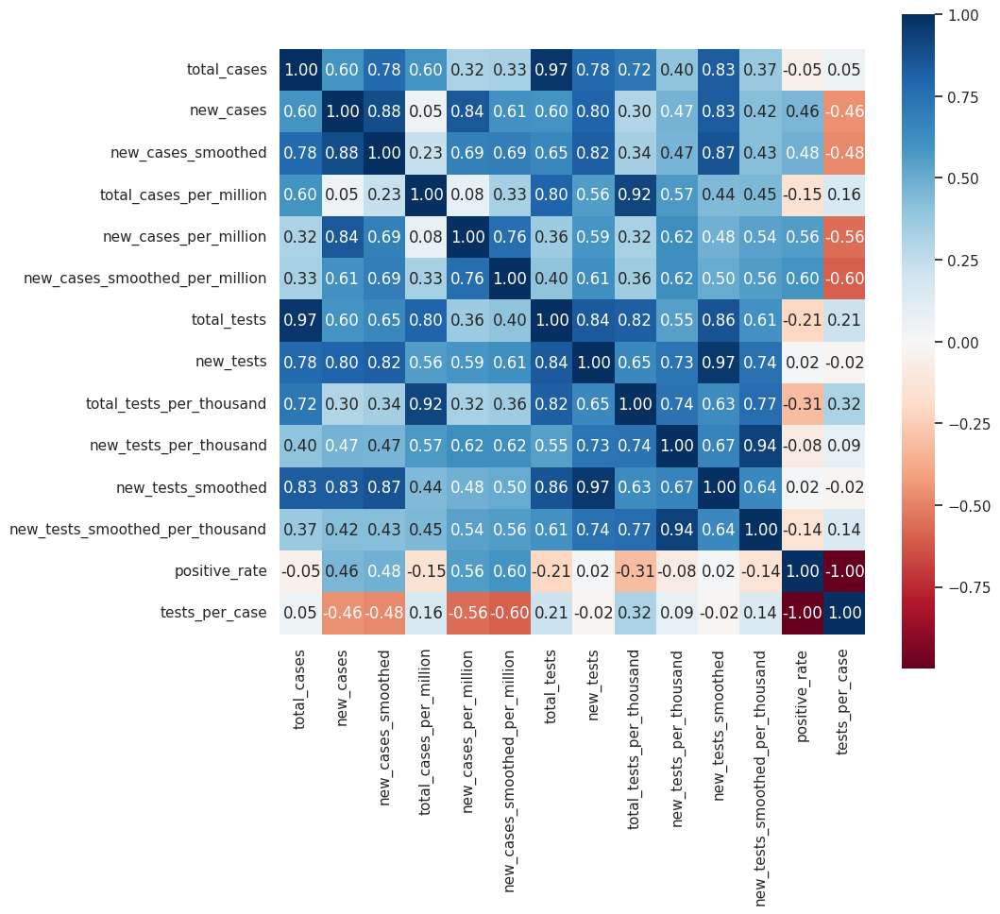

In [78]:
# correlation heatmap
sns.set (rc = {'figure.figsize':(10, 9)})
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

There is a strong correlation between `total_cases_per_million` and `total_test_per_thousand` (0.92ρ).

# Deaths


Now, proceeding with the registered deaths that were attributed to COVID-19. Important to state that counts can also include probable deaths, where reported.

Selecting the attributes that will be analyzed in this part of the research.

In [24]:
df_deaths = df[['location', 'date','total_deaths', 'new_deaths','new_deaths_smoothed','total_deaths_per_million',
                'new_deaths_per_million','new_deaths_smoothed_per_million','excess_mortality_cumulative_absolute',
                'excess_mortality_cumulative','excess_mortality', 'excess_mortality_cumulative_per_million']]

### Variables dictionary

* `location` -	Geographical location
* `date`	- Date of observation
* `total_deaths` -	Total deaths attributed to COVID-19. Counts can include probable deaths, where reported.
* `new_deaths` - New deaths attributed to COVID-19. Counts can include probable deaths, where reported. In rare cases where our source reports a negative daily change due to a data correction, we set this metric to NA.
* `new_deaths_smoothed` - New deaths attributed to COVID-19 (7-day smoothed). Counts can include probable deaths, where reported.
* `total_deaths_per_million` - Total deaths attributed to COVID-19 per 1,000,000 people. Counts can include probable deaths, where reported.
* `new_deaths_per_million` - New deaths attributed to COVID-19 per 1,000,000 people. Counts can include probable deaths, where reported.
* `new_deaths_smoothed_per_million` - New deaths attributed to COVID-19 (7-day smoothed) per 1,000,000 people. Counts can include probable deaths, where reported.
* `excess_mortality` - Percentage difference between the reported number of weekly or monthly deaths in 2020–2021 and the projected number of deaths for the same period based on previous years.
* `excess_mortality_cumulative` - Percentage difference between the cumulative number of deaths since 1 January 2020 and the cumulative projected deaths for the same period based on previous years.
* `excess_mortality_cumulative_absolute` - Cumulative difference between the reported number of deaths since 1 January 2020 and the projected number of deaths for the same period based on previous years.
* `excess_mortality_cumulative_per_million` - Cumulative difference between the reported number of deaths since 1 January 2020 and the projected number of deaths for the same period based on previous years, per million people.

### Data cleaning

**Missing values**

Now we are going to check where exactly in this new Data Frame are the missing or nonvalid data.

In [25]:
# variables sorted by the percentage of their missing values
pd.set_option('display.max_rows', None)
(df_deaths.isnull().sum() / df_deaths.shape[0]).sort_values(ascending=False)

excess_mortality_cumulative_absolute       0.937981
excess_mortality_cumulative                0.937981
excess_mortality                           0.937981
excess_mortality_cumulative_per_million    0.937981
total_deaths                               0.140097
total_deaths_per_million                   0.140097
new_deaths_smoothed                        0.004766
new_deaths_smoothed_per_million            0.004766
new_deaths                                 0.000196
new_deaths_per_million                     0.000196
location                                   0.000000
date                                       0.000000
dtype: float64

In [26]:
pd.set_option('display.max_rows', 10)

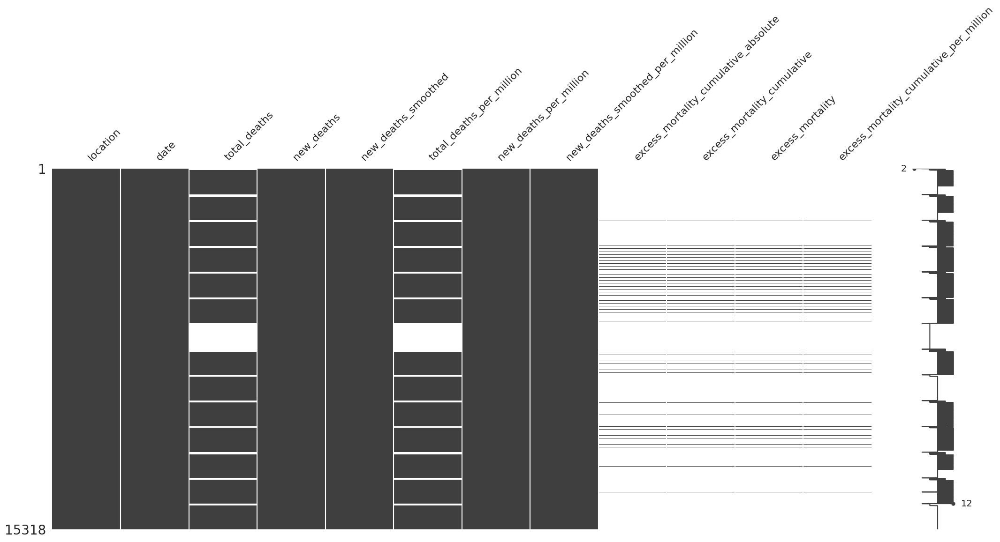

In [27]:
# generates a visualization of the entries with null values
missingno.matrix(df_deaths)
plt.show()

The attributes related to `excess mortality` have a high absence rate. Possibly countries that started this registration late or that didn't do it at all. We'll be able to check this at the graphs.




In [28]:
# countries with less information on total deaths
df_info = []
for country in df_deaths.location.unique():
  df_tmp = df_deaths.loc[df_deaths['location'] == country]
  null_value = (df_tmp['total_deaths'].isnull().sum() / df_tmp.shape[0])
  df_info.append(
          {
              'Country': country,
              'Total_deaths_null': null_value,
          }
      )

df_info = pd.DataFrame(df_info)
pd.set_option('display.max_rows', 14)
df_info.sort_values('Total_deaths_null', ascending=False, ignore_index=True)

,Country,Total_deaths_null
0,Falkland Islands,1.000000
1,French Guiana,0.099634
2,Suriname,0.086837
3,Uruguay,0.081353
4,Bolivia,0.080439
5,Venezuela,0.078611
6,Chile,0.073126
7,Colombia,0.073126
8,Paraguay,0.072212
9,Brazil,0.069470


The dataset doesn't have mortality information from the Falkland Islands.

### Time series

At this point, we are going to look into the time series of the data from each country.

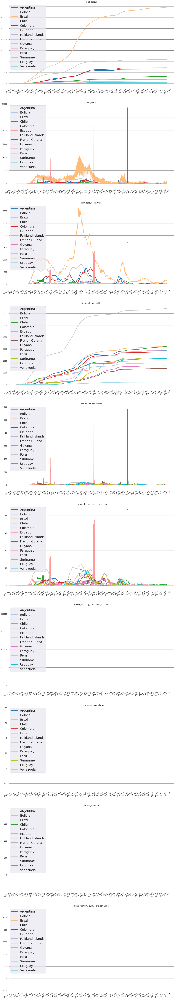

In [29]:
fig, axs = plt.subplots(10, 1, figsize = (20,120)) # adjust the the position of the plots


colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate graphs
i = 0
n = 0
for col in range(2, 12):
  for country in df_deaths.location.unique():
    axs[n].plot(df_deaths.loc[df_deaths['location'] == country].date,
                df_deaths.loc[df_deaths['location'] == country].iloc[:,[col]],
                label = country, c = colors[i], linewidth=3)
    i+=1
  axs[n].set_title(df_deaths.columns[col])
  axs[n].legend(fontsize = 'xx-large', loc = 'upper left')
  # Text in the x-axis will be displayed in 'YYYY-mm' format.
  axs[n].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
  axs[n].xaxis.set_major_locator(mdates.MonthLocator())
  # Rotates and right-aligns the x labels so they don't crowd each other.
  for label in axs[n].get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')

  axs[n].spines['top'].set_visible(False)
  axs[n].spines['right'].set_visible(False)
  axs[n].spines['left'].set_visible(False)

  axs[n].yaxis.grid(True, color ="gray") #grid based on y axis
  axs[n].set_facecolor("white") #backgroud color

  # Rotates and right-aligns the x labels so they don't crowd each other.
  for label in axs[n].get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')
  i=0
  n+=1

plt.show()

From this quick and simple exposition of the data, we can more easily select the information in which we will go deeper.

There is not enough data to assess excess mortality on the continent.

Let's start with **Total Deaths**.

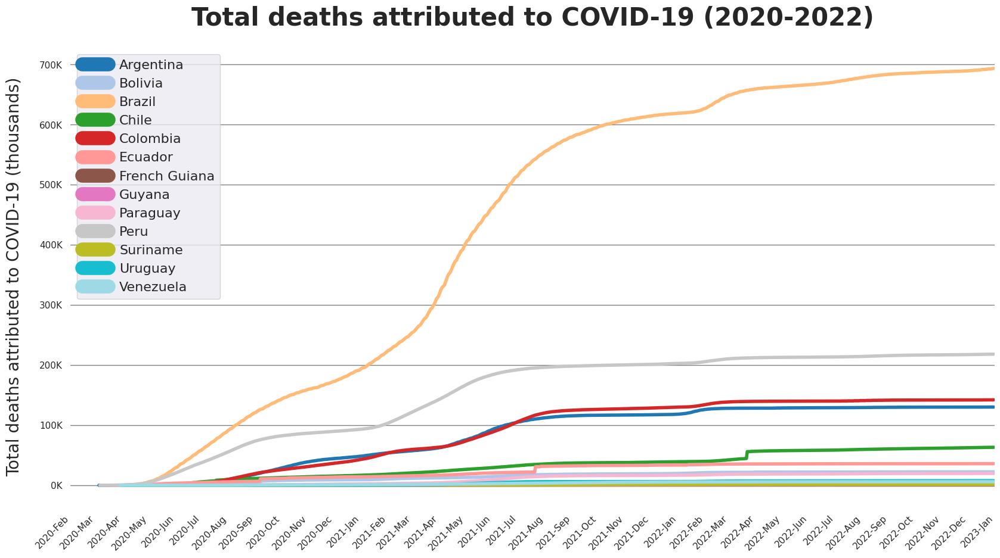

In [30]:
# Plotting Total Deaths

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country

locations = list(df_deaths.location.unique())
locations.remove('Falkland Islands')


i=0 # variable to count during the for loop
custom_lines = []
for country in locations: # data that will be ploted
  ax.plot(df_deaths.loc[df_deaths['location'] == country].date,
              df_deaths.loc[df_deaths['location'] == country].total_deaths,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  if i==5: #So the countries can maintain the respective colors despite Falkland Islands abscence
    i+=1
  i+=1

ax.legend(custom_lines, locations, fontsize = 16)

ax.set_title("Total deaths attributed to COVID-19 (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)

# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])


ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x/1000)) + 'K'))

# label x-axis and y-axis
ax.set_ylabel('Total deaths attributed to COVID-19 (thousands)', fontsize = '20', labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')
ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

Again, the countries with the largest populations are the ones with the highest death rates. Brazil comes in first place, followed by Peru, Colombia, Argentina, and Chile, in this order.

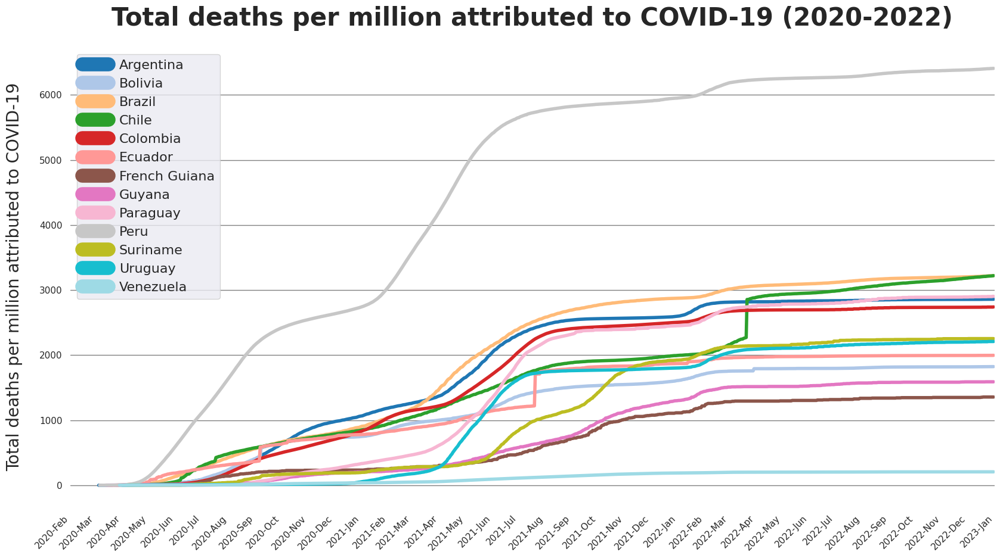

In [31]:
# Plotting Total Deaths per million

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country

locations = list(df_deaths.location.unique())
locations.remove('Falkland Islands')


i=0 # variable to count during the for loop
custom_lines = []
for country in locations: # data that will be ploted
  ax.plot(df_deaths.loc[df_deaths['location'] == country].date,
              df_deaths.loc[df_deaths['location'] == country].total_deaths_per_million,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  if i==5: #So the countries can maintain the respective colors despite Falkland Islands abscence
    i+=1
  i+=1

ax.legend(custom_lines, locations, fontsize = 16)

ax.set_title("Total deaths per million attributed to COVID-19 (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)

# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])


ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x))))

# label x-axis and y-axis
ax.set_ylabel('Total deaths per million attributed to COVID-19', fontsize = '20', labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')
ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

In [32]:
# Total deaths per million - Bar chart race

#Setting up the Dataframe to create the Bar chart race

locations = list(df_deaths.location.unique())
locations.remove('Falkland Islands')

df_temp_complete = pd.DataFrame()
for country in locations:
  df_temp = (pd.DataFrame(df_deaths.loc[df_deaths['location'] == country].total_deaths_per_million).reset_index()).drop(['index'], axis=1).T
  df_temp.insert(0,'Country', country )
  df_temp_complete = pd.concat([df_temp_complete, df_temp], ignore_index = True)
  df_temp_complete.reset_index()

df_date = pd.DataFrame(df_deaths.loc[df_deaths['location'] == 'Argentina'].date.reset_index()).drop(['index'], axis=1)
df_date['date'] = df_date['date'].dt.strftime('%d %b %Y')
df_date = df_date.T
df_date.insert(0,'Country', 'Date')

df_temp_complete = pd.concat([df_date, df_temp_complete], ignore_index = True)

df_temp_complete.to_csv('bar_chart_total_deaths_per_million.csv',header=False, index=False)


The [bar chart race](https://youtu.be/9yZvsXOayVo) was created with Flourish.


The bar chart race indicates that Peru had the highest number of deaths per million throughout the entire studied period, with a significant lead over the other countries. Venezuela, in turn, had the lowest number.

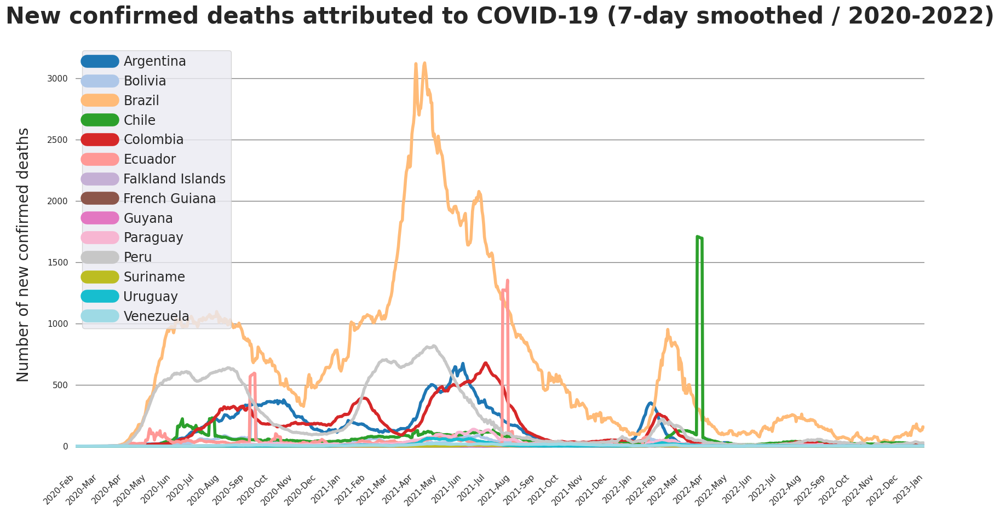

In [33]:
# Plotting new deaths smoothed

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country

i=0 # variable to count during the for loop
custom_lines = []
for country in df_deaths.location.unique(): # data that will be ploted
  ax.plot(df_deaths.loc[df_deaths['location'] == country].date,
              df_deaths.loc[df_deaths['location'] == country].new_deaths_smoothed,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

ax.legend(custom_lines, df_deaths['location'].unique(), fontsize = 17, loc = 'upper left')

ax.set_title("New confirmed deaths attributed to COVID-19 (7-day smoothed / 2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)


# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x))))

# label x-axis and y-axis
ax.set_ylabel('Number of new confirmed deaths', fontsize = '20', labelpad=20)
#ax.set_xlabel('Date', fontsize = 20, labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')

ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

The graph shows three distinctive main peaks in the number of new deaths, in almost every country: **Jun-Sep 2020**, **Apr-Jul 2021**, **Feb-Apr 2022** (approximate dates).

Notice that there is a conformity between the peaks of these occurrences and the death rate. However, the highest peak of deaths doesn't correspond with the highest peak of cases. This could be due to different strains or variations of the virus, or possibly due to a greater level of immunity throughout the population, since the highest peak of new cases, with lower mortality, happens later.





## Correlations

In [79]:
# correlation matrix
corr = df_deaths[['total_deaths', 'new_deaths', 'new_deaths_smoothed','total_deaths_per_million','new_deaths_per_million','new_deaths_smoothed_per_million']].corr(method ='spearman')

display(corr)

,total_deaths,new_deaths,new_deaths_smoothed,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million
total_deaths,1.000000,0.559207,0.674099,0.790183,0.288931,0.257646
new_deaths,0.559207,1.000000,0.918728,0.176057,0.903766,0.771442
new_deaths_smoothed,0.674099,0.918728,1.000000,0.282962,0.797229,0.839535
total_deaths_per_million,0.790183,0.176057,0.282962,1.000000,0.059988,0.095222
new_deaths_per_million,0.288931,0.903766,0.797229,0.059988,1.000000,0.854733
new_deaths_smoothed_per_million,0.257646,0.771442,0.839535,0.095222,0.854733,1.000000


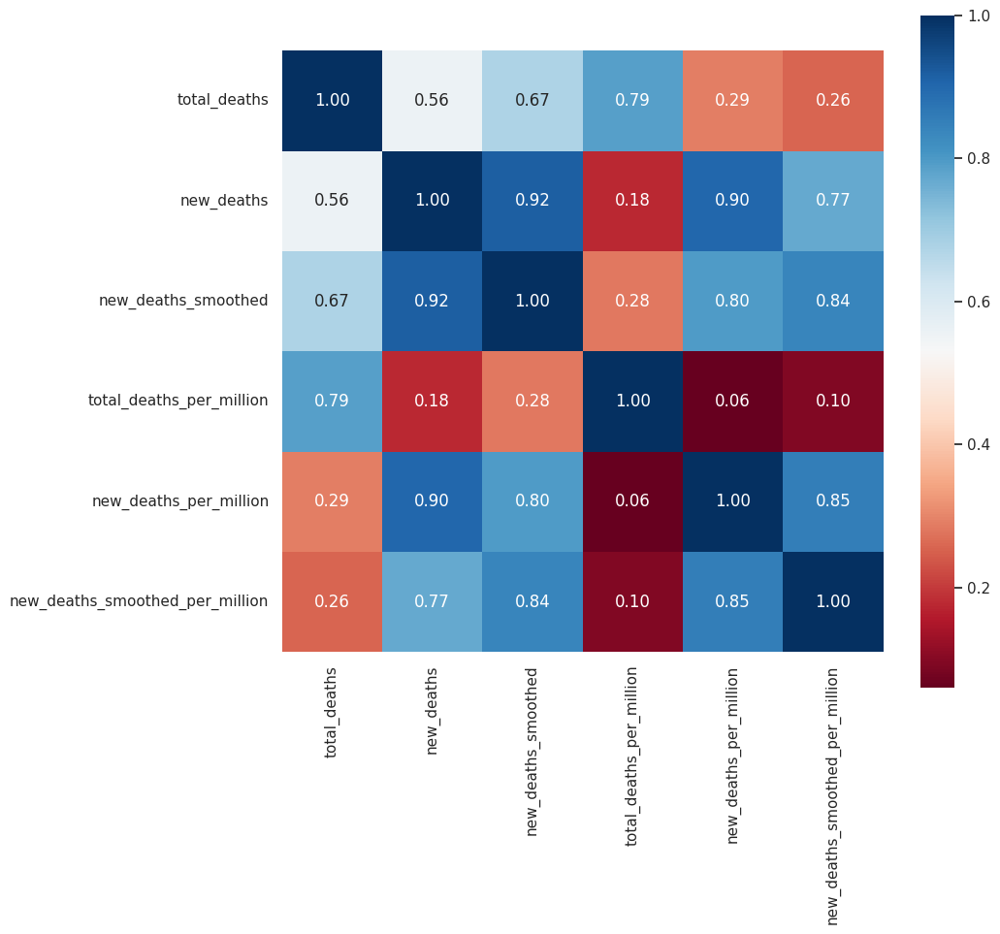

In [80]:
# correlation heatmap
sns.set (rc = {'figure.figsize':(10, 9)})
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

No particularly useful information could be inferred from this correlation map.

# Vaccination

Before commenting on the vaccination data, it has to be stated that the database had little or no data from Venezuela, French Guiana, and the Falkland Islands.

Selecting the attributes that will be analyzed in this part of the research.

In [36]:
df_vax = df[['location', 'date','total_vaccinations','people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
             'new_vaccinations', 'new_vaccinations_smoothed','total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
             'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred','new_vaccinations_smoothed_per_million',
             'new_people_vaccinated_smoothed','new_people_vaccinated_smoothed_per_hundred']]

In [37]:
#filtrar por data 2021
df_vax = df_vax[(df_vax['date'] >= '2021-01-01') & (df['date'] <= '2022-12-31')]

### Variables dictionary

* `location` -	Geographical location
* `date`	- Date of observation
* `total_vaccinations` -	Total number of COVID-19 vaccination doses administered.
* `people_vaccinated` -	Total number of people who received at least one vaccine dose.
* `people_fully_vaccinated` -	Total number of people who received all doses prescribed by the initial vaccination protocol.
* `total_boosters` - Total number of COVID-19 vaccination booster doses administered (doses administered beyond the number prescribed by the vaccination protocol).
* `new_vaccinations` -	New COVID-19 vaccination doses administered (only calculated for consecutive days).
* `new_vaccinations_smoothed` -	New COVID-19 vaccination doses administered (7-day smoothed). For countries that don't report vaccination data on a daily basis, we assume that vaccination changed equally on a daily basis over any periods in which no data was reported. This produces a complete series of daily figures, which is then averaged over a rolling 7-day window.
* `total_vaccinations_per_hundred` -	Total number of COVID-19 vaccination doses administered per 100 people in the total population.
* `people_vaccinated_per_hundred` -	Total number of people who received at least one vaccine dose per 100 people in the total population.
* `people_fully_vaccinated_per_hundred` -	Total number of people who received all doses prescribed by the initial vaccination protocol per 100 people in the total population.
* `total_boosters_per_hundred` -	Total number of COVID-19 vaccination booster doses administered per 100 people in the total population.
* `new_vaccinations_smoothed_per_million` -	New COVID-19 vaccination doses administered (7-day smoothed) per 1,000,000 people in the total population.
* `new_people_vaccinated_smoothed` -	Daily number of people receiving their first vaccine dose (7-day smoothed).
* `new_people_vaccinated_smoothed_per_hundred` -	Daily number of people receiving their first vaccine dose (7-day smoothed) per 100 people in the total population.




### Data cleaning


**Missing values**

Now we are going to check where exactly in this new Data Frame are the missing or nonvalid data.

In [38]:
# variables sorted by the percentage of their missing values
pd.set_option('display.max_rows', None)
(df_vax.isnull().sum() / df_vax.shape[0]).sort_values(ascending=False)

total_boosters                                0.646477
total_boosters_per_hundred                    0.646477
new_vaccinations                              0.497358
people_fully_vaccinated                       0.472114
people_fully_vaccinated_per_hundred           0.472114
people_vaccinated                             0.462231
people_vaccinated_per_hundred                 0.462231
total_vaccinations                            0.454501
total_vaccinations_per_hundred                0.454501
new_people_vaccinated_smoothed                0.211448
new_people_vaccinated_smoothed_per_hundred    0.211448
new_vaccinations_smoothed                     0.209100
new_vaccinations_smoothed_per_million         0.209100
location                                      0.000000
date                                          0.000000
dtype: float64

In [39]:
pd.set_option('display.max_rows', 10)

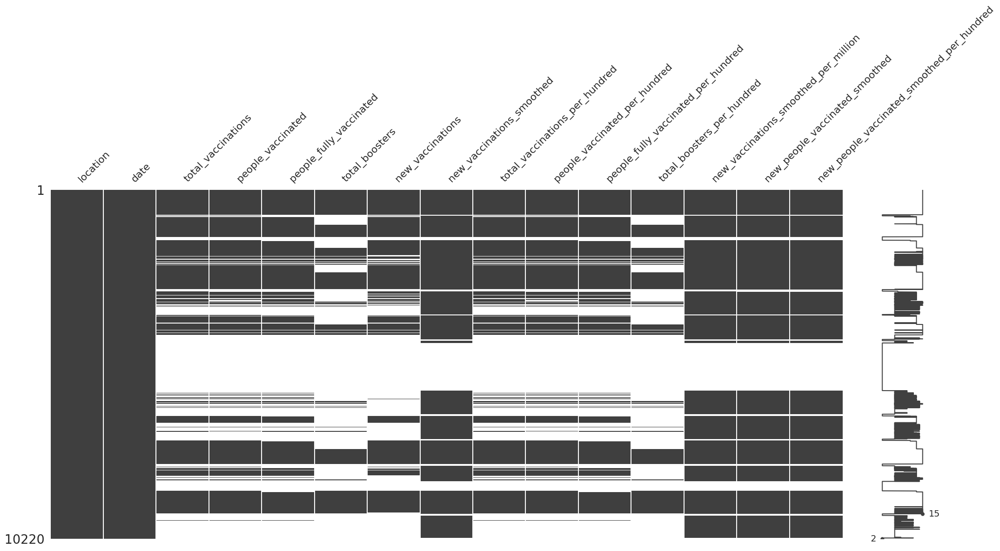

In [40]:
# generates a visualization of the entries with null values
missingno.matrix(df_vax)
plt.show()

Aparently some coutries have little or none information about vaccination for COVID-19.




In [41]:
# countries with less information on total_vaccinations
df_info = []
for country in df_vax.location.unique():
  df_tmp = df_vax.loc[df_vax['location'] == country]
  null_value = (df_tmp['total_boosters_per_hundred'].isnull().sum() / df_tmp.shape[0])
  df_info.append(
          {
              'Country': country,
              'People_fully_vaccinated': null_value,
          }
      )

df_info = pd.DataFrame(df_info)
pd.set_option('display.max_rows', 14)
df_info.sort_values('People_fully_vaccinated', ascending=False, ignore_index=True)

,Country,People_fully_vaccinated
0,Falkland Islands,1.000000
1,French Guiana,1.000000
2,Venezuela,0.994521
3,Suriname,0.982192
4,Guyana,0.936986
5,Paraguay,0.930137
6,Colombia,0.868493
7,Ecuador,0.575342
8,Bolivia,0.508219
9,Brazil,0.446575


In [42]:
# countries with less information on total_vaccinations
df_info = []
for country in df_vax.location.unique():
  df_tmp = df_vax.loc[df_vax['location'] == country]
  null_value = (df_tmp['people_fully_vaccinated'].isnull().sum() / df_tmp.shape[0])
  df_info.append(
          {
              'Country': country,
              'People_fully_vaccinated': null_value,
          }
      )

df_info = pd.DataFrame(df_info)
pd.set_option('display.max_rows', 14)
df_info.sort_values('People_fully_vaccinated', ascending=False, ignore_index=True)

,Country,People_fully_vaccinated
0,French Guiana,1.000000
1,Falkland Islands,0.997260
2,Venezuela,0.975342
3,Guyana,0.838356
4,Suriname,0.710959
5,Paraguay,0.675342
6,Colombia,0.564384
7,Ecuador,0.241096
8,Bolivia,0.195890
9,Brazil,0.156164


### Time series

At this point, we are going to look into the time series of the data from each country.

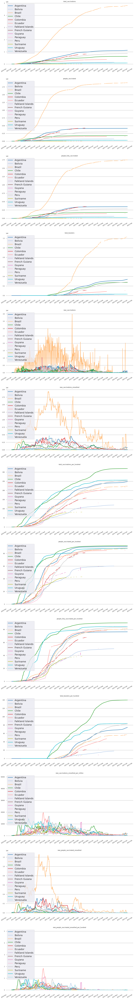

In [43]:
fig, axs = plt.subplots(13, 1, figsize = (20,156)) # adjust the the position of the plots


colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate graphs
i = 0
n = 0
for col in range(2, 15):
  for country in df_vax.location.unique():
    axs[n].plot(df_vax.loc[df_vax['location'] == country].date,
                df_vax.loc[df_vax['location'] == country].iloc[:,[col]],
                label = country, c = colors[i], linewidth=3)
    i+=1
  axs[n].set_title(df_vax.columns[col])
  axs[n].legend(fontsize = 'xx-large', loc = 'upper left')
  # Text in the x-axis will be displayed in 'YYYY-mm' format.
  axs[n].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
  axs[n].xaxis.set_major_locator(mdates.MonthLocator())
  # Rotates and right-aligns the x labels so they don't crowd each other.
  for label in axs[n].get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')

  axs[n].spines['top'].set_visible(False)
  axs[n].spines['right'].set_visible(False)
  axs[n].spines['left'].set_visible(False)

  axs[n].yaxis.grid(True, color ="gray") #grid based on y axis
  axs[n].set_facecolor("white") #backgroud color

  # Rotates and right-aligns the x labels so they don't crowd each other.
  for label in axs[n].get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')
  i=0
  n+=1

plt.show()

From this quick and simple exposition of the data, we can more easily select the information in which we will go deeper.

Let's start with total **people vaccinated per hundred**.

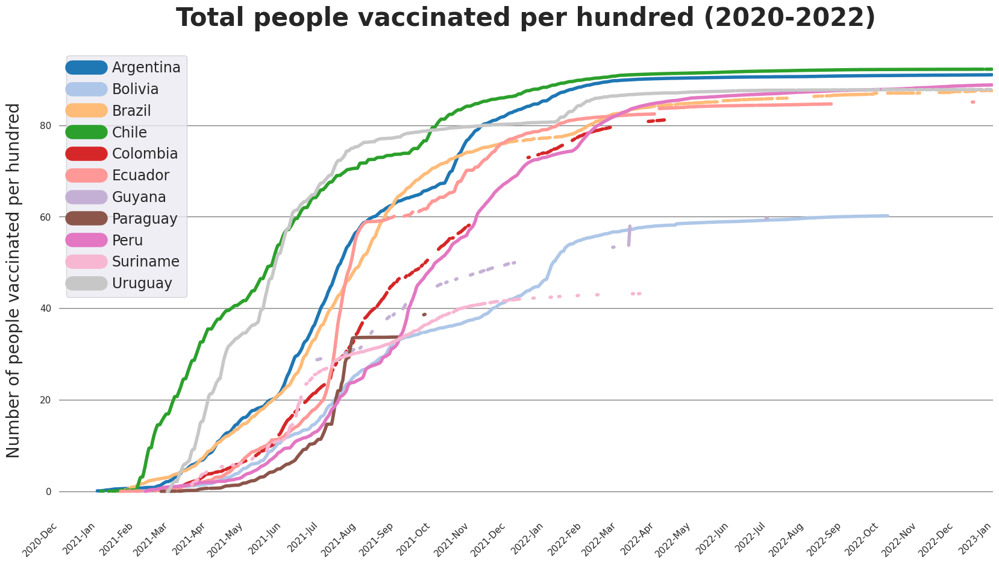

In [44]:
# Plotting people vaccinated per hundred

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country


countries = list(df_vax.location.unique())
# countries without test data
countries.remove('Venezuela')
countries.remove('French Guiana')
countries.remove('Falkland Islands')


i=0 # variable to count during the for loop
custom_lines = []
for country in countries: # data that will be ploted
  ax.plot(df_vax.loc[df_vax['location'] == country].date,
             df_vax.loc[df_vax['location'] == country].people_vaccinated_per_hundred,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

ax.legend(custom_lines, countries, fontsize = 17)

ax.set_title("Total people vaccinated per hundred (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)


# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 12, 1), datetime.date(2023, 1, 1)])

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x))))

# label x-axis and y-axis
ax.set_ylabel('Number of people vaccinated per hundred', fontsize = '20', labelpad=20)
#ax.set_xlabel('Date', fontsize = 20, labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')

ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

The chart above contemplates people who received at least one vaccine dose while the graph below shows the number of people who received all doses prescribed by the initial vaccination protocol.

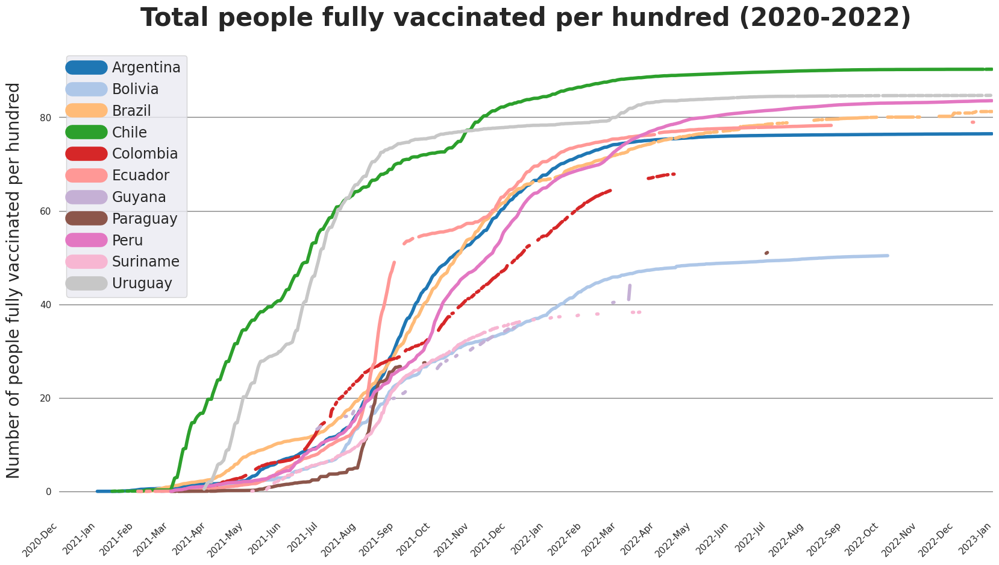

In [45]:
# Plotting people fully vaccinated per hundred

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country


countries = list(df_vax.location.unique())
# countries without test data
countries.remove('Venezuela')
countries.remove('French Guiana')
countries.remove('Falkland Islands')

i=0 # variable to count during the for loop
custom_lines = []
for country in countries: # data that will be ploted
  ax.plot(df_vax.loc[df_vax['location'] == country].date,
             df_vax.loc[df_vax['location'] == country].people_fully_vaccinated_per_hundred,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

ax.legend(custom_lines, countries, fontsize = 17)

ax.set_title("Total people fully vaccinated per hundred (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)


# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 12, 1), datetime.date(2023, 1, 1)])

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x))))

# label x-axis and y-axis
ax.set_ylabel('Number of people fully vaccinated per hundred', fontsize = '20', labelpad=20)
#ax.set_xlabel('Date', fontsize = 20, labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')

ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

There's little difference between both plots. In general, the increase in vaccinated people happened in the continent from **February to December 2021**.

**Chile** and **Uruguay** achieved a high percentage of vaccinated people earlier when compared to the other countries.

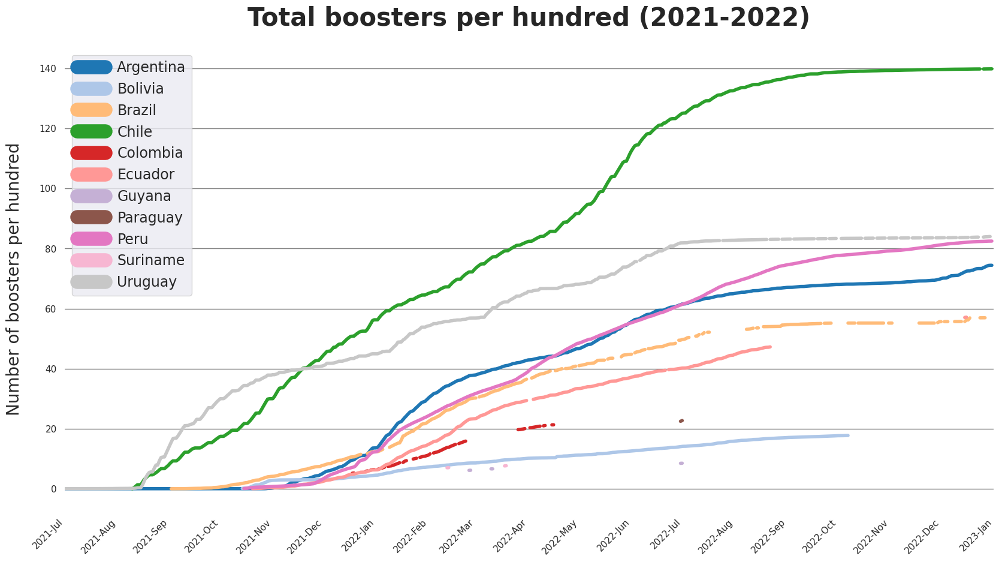

In [46]:
# Plotting total boosters per hundred

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country

countries = list(df_vax.location.unique())
# countries without test data
countries.remove('Venezuela')
countries.remove('French Guiana')
countries.remove('Falkland Islands')

i=0 # variable to count during the for loop
custom_lines = []
for country in countries: # data that will be ploted
  ax.plot(df_vax.loc[df_vax['location'] == country].date,
             df_vax.loc[df_vax['location'] == country].total_boosters_per_hundred,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

ax.legend(custom_lines, countries, fontsize = 17)

ax.set_title("Total boosters per hundred (2021-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)


# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2021, 7, 1), datetime.date(2023, 1, 1)])

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x))))

# label x-axis and y-axis
ax.set_ylabel('Number of boosters per hundred', fontsize = '20', labelpad=20)
#ax.set_xlabel('Date', fontsize = 20, labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')

ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

Concerning the 'boosters', doses administered beyond the number prescribed by the vaccination protocol, **Chile** loomed by being the only country that surpassed the milestone of 100 boosters per hundred people.

## Correlations

In [81]:
# correlation matrix
corr = df_vax.corr(method ='spearman')

display(corr)

<ipython-input-81-d429da986890>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df_vax.corr(method ='spearman')


,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred
total_vaccinations,1.000000,0.988349,0.992412,0.833489,0.452448,0.559585,0.680311,0.728554,0.611366,0.364779,0.111933,0.209839,-0.240270
people_vaccinated,0.988349,1.000000,0.978792,0.750880,0.526219,0.631732,0.589090,0.645007,0.513940,0.247554,0.154403,0.308653,-0.154351
people_fully_vaccinated,0.992412,0.978792,1.000000,0.813016,0.427047,0.525226,0.651005,0.707986,0.615328,0.316855,0.075866,0.185261,-0.252932
total_boosters,0.833489,0.750880,0.813016,1.000000,0.049513,0.123247,0.753423,0.802879,0.677574,0.754718,-0.350355,-0.205033,-0.588353
new_vaccinations,0.452448,0.526219,0.427047,0.049513,1.000000,0.887329,-0.111712,-0.059396,-0.167967,-0.376308,0.591633,0.766510,0.484597
new_vaccinations_smoothed,0.559585,0.631732,0.525226,0.123247,0.887329,1.000000,-0.037569,0.020054,-0.103650,-0.352884,0.729309,0.896465,0.552148
total_vaccinations_per_hundred,0.680311,0.589090,0.651005,0.753423,-0.111712,-0.037569,1.000000,0.988784,0.987317,0.974816,-0.127314,-0.424868,-0.603617
people_vaccinated_per_hundred,0.728554,0.645007,0.707986,0.802879,-0.059396,0.020054,0.988784,1.000000,0.962788,0.920884,-0.097243,-0.378587,-0.579230
people_fully_vaccinated_per_hundred,0.611366,0.513940,0.615328,0.677574,-0.167967,-0.103650,0.987317,0.962788,1.000000,0.945015,-0.179177,-0.463640,-0.624247
total_boosters_per_hundred,0.364779,0.247554,0.316855,0.754718,-0.376308,-0.352884,0.974816,0.920884,0.945015,1.000000,-0.509610,-0.655731,-0.787768


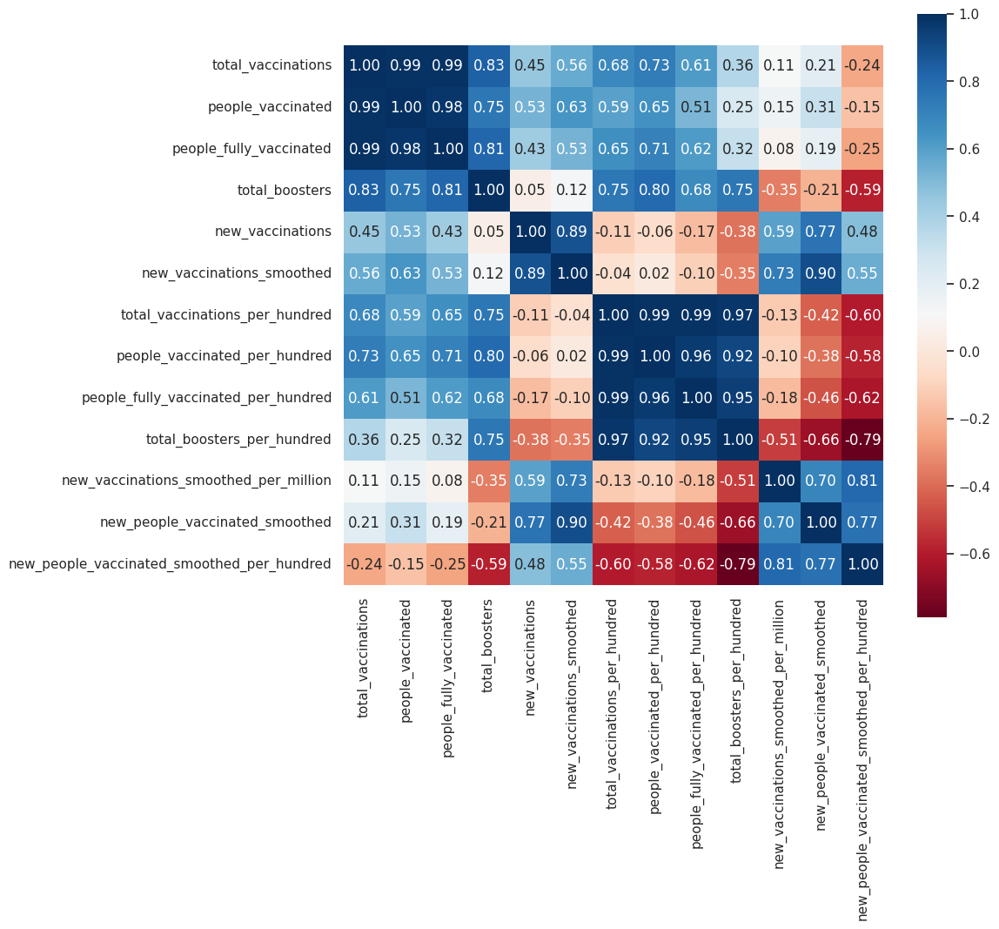

In [82]:
# correlation heatmap
sns.set (rc = {'figure.figsize':(10, 9)})
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

No particularly useful information could be inferred from this correlation map.

#Hospitalization

It wasn't possible to carry out an in-depth analysis of the hospitalization panorama as the database is very scarce in relation to this aspect. However, given the available data, we can see the number of patients per million in the ICU (intensive care units), in three countries: Argentina, Bolivia, and Chile.

Selecting the attributes that will be analyzed in this part.

In [49]:
df_hosp = df[['location', 'date','icu_patients','icu_patients_per_million', 'hosp_patients','hosp_patients_per_million',
             'weekly_icu_admissions','weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
             'weekly_hosp_admissions_per_million']]

### Variables dictionary

* `location` -	Geographical location
* `date`	- Date of observation
* `icu_patients` -	Number of COVID-19 patients in intensive care units (ICUs) on a given day
* `icu_patients_per_million` -	Number of COVID-19 patients in intensive care units (ICUs) on a given day per 1,000,000 people
* `hosp_patients` -	Number of COVID-19 patients in hospital on a given day
* `hosp_patients_per_million` -	Number of COVID-19 patients in hospital on a given day per 1,000,000 people
* `weekly_icu_admissions` -	Number of COVID-19 patients newly admitted to intensive care units (ICUs) in a given week (reporting date and the preceeding 6 days)
* `weekly_icu_admissions_per_million` -	Number of COVID-19 patients newly admitted to intensive care units (ICUs) in a given week per 1,000,000 people (reporting date and the preceeding 6 days)
* `weekly_hosp_admissions` -	Number of COVID-19 patients newly admitted to hospitals in a given week (reporting date and the preceeding 6 days)
* `weekly_hosp_admissions_per_million` -	Number of COVID-19 patients newly admitted to hospitals in a given week per 1,000,000 people (reporting date and the preceeding 6 days)

### Data cleaning


**Missing values**

Now we are going to check where exactly in this new Data Frame are the missing or nonvalid data.

In [50]:
# variables sorted by the percentage of their missing values
pd.set_option('display.max_rows', None)
(df_hosp.isnull().sum() / df_hosp.shape[0]).sort_values(ascending=False)

hosp_patients                         0.965792
hosp_patients_per_million             0.965792
weekly_icu_admissions                 0.935305
weekly_icu_admissions_per_million     0.935305
weekly_hosp_admissions                0.934783
weekly_hosp_admissions_per_million    0.934783
icu_patients                          0.857945
icu_patients_per_million              0.857945
location                              0.000000
date                                  0.000000
dtype: float64

In [51]:
pd.set_option('display.max_rows', 10)

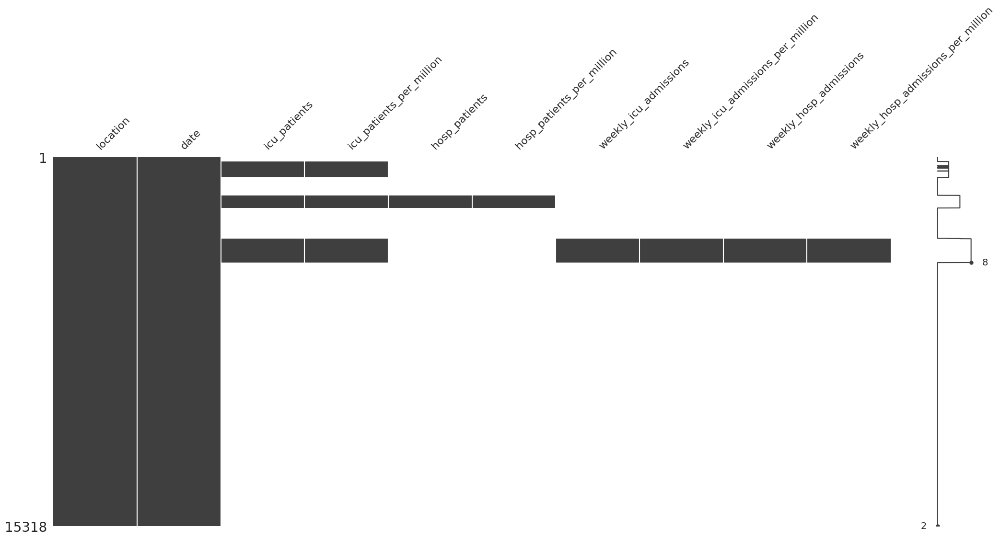

In [52]:
# generates a visualization of the entries with null values ///  manter ou não?
missingno.matrix(df_hosp)
plt.show()

In [53]:
# countries with more information on hospitalization
df_info = []
for country in df_hosp.location.unique():
  df_tmp = df_hosp.loc[df_hosp['location'] == country]
  null_value = (df_tmp['icu_patients'].isnull().sum() / df_tmp.shape[0])
  df_info.append(
          {
              'Country': country,
              'icu_patients': null_value,
          }
      )

df_info = pd.DataFrame(df_info)
pd.set_option('display.max_rows', 14)
df_info.sort_values('icu_patients', ascending=True, ignore_index=True)

,Country,icu_patients
0,Chile,0.081353
1,Argentina,0.409672
2,Bolivia,0.521024
3,Brazil,1.000000
4,Colombia,1.000000
5,Ecuador,1.000000
6,Falkland Islands,1.000000
7,French Guiana,1.000000
8,Guyana,1.000000
9,Paraguay,1.000000


The given data source only have hospitalization data of basically three countries Chile, Argentina and Bolivia.

### Time series

At this point, we are going to look into the time series of the data from each country.

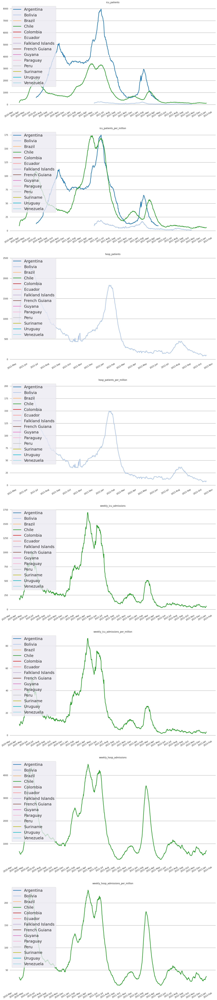

In [54]:
fig, axs = plt.subplots(8, 1, figsize = (20,96)) # adjust the the position of the plots


colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate graphs
n = 0

i=0
for col in range(2, 10):
  for country in df_hosp.location.unique():
    axs[n].plot(df_hosp.loc[df_hosp['location'] == country].date,
                df_hosp.loc[df_hosp['location'] == country].iloc[:,[col]],
                label = country, c = colors[i], linewidth=3)
    i+=1
  axs[n].set_title(df_hosp.columns[col])
  axs[n].legend(fontsize = 'xx-large', loc = 'upper left')
  # Text in the x-axis will be displayed in 'YYYY-mm' format.
  axs[n].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
  axs[n].xaxis.set_major_locator(mdates.MonthLocator())
  # Rotates and right-aligns the x labels so they don't crowd each other.
  for label in axs[n].get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')

  axs[n].spines['top'].set_visible(False)
  axs[n].spines['right'].set_visible(False)
  axs[n].spines['left'].set_visible(False)

  axs[n].yaxis.grid(True, color ="gray") #grid based on y axis
  axs[n].set_facecolor("white") #backgroud color

  # Rotates and right-aligns the x labels so they don't crowd each other.
  for label in axs[n].get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')
  i=0
  n+=1

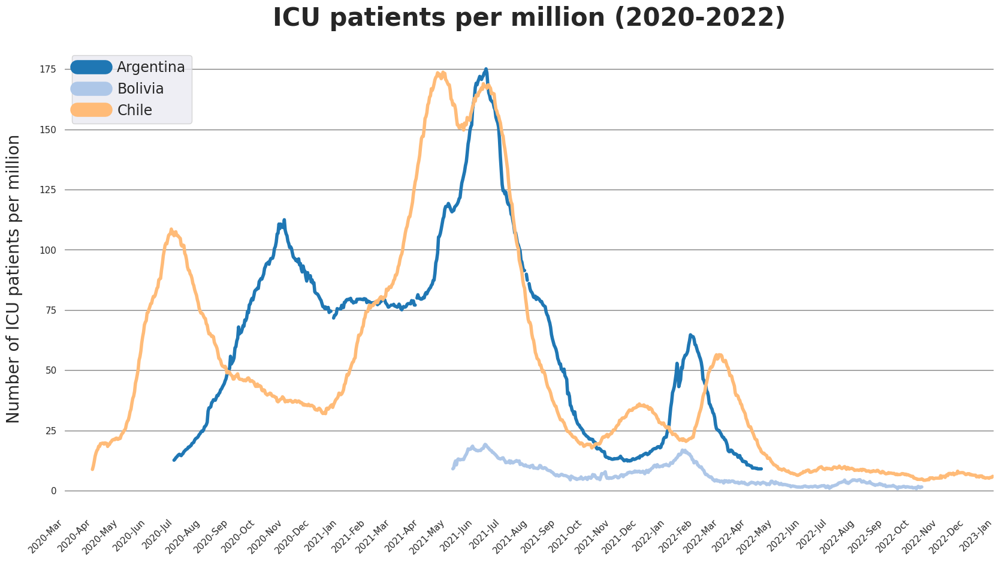

In [55]:
# Plotting total boosters per hundred

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country

countries = ['Argentina', 'Bolivia', 'Chile']


i=0 # variable to count during the for loop
custom_lines = []
for country in countries: # data that will be ploted
  ax.plot(df_hosp.loc[df_hosp['location'] == country].date,
             df_hosp.loc[df_hosp['location'] == country].icu_patients_per_million,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

ax.legend(custom_lines, countries, fontsize = 17, loc = 'upper left')

ax.set_title("ICU patients per million (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)


# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 3, 1), datetime.date(2023, 1, 1)])

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x))))

# label x-axis and y-axis
ax.set_ylabel('Number of ICU patients per million', fontsize = '20', labelpad=20)
#ax.set_xlabel('Date', fontsize = 20, labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')

ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

In this graph, we can also see the three peaks of the pandemic identified in the total registered cases and total attributed deaths plots. As in the  total attributed death plot, the highest number of ICU patients occurred in mid-2021.


## Correlations

In [83]:
# correlation matrix
corr = df_hosp.corr(method = 'spearman')

display(corr)

<ipython-input-83-1e8afee9d3db>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df_hosp.corr(method = 'spearman')


,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million
icu_patients,1.000000,0.958908,0.976602,0.976602,0.967586,0.967586,0.810790,0.810790
icu_patients_per_million,0.958908,1.000000,0.976602,0.976602,0.967586,0.967586,0.810790,0.810790
hosp_patients,0.976602,0.976602,1.000000,1.000000,NaN,NaN,NaN,NaN
hosp_patients_per_million,0.976602,0.976602,1.000000,1.000000,NaN,NaN,NaN,NaN
weekly_icu_admissions,0.967586,0.967586,NaN,NaN,1.000000,1.000000,0.883203,0.883203
weekly_icu_admissions_per_million,0.967586,0.967586,NaN,NaN,1.000000,1.000000,0.883203,0.883203
weekly_hosp_admissions,0.810790,0.810790,NaN,NaN,0.883203,0.883203,1.000000,1.000000
weekly_hosp_admissions_per_million,0.810790,0.810790,NaN,NaN,0.883203,0.883203,1.000000,1.000000


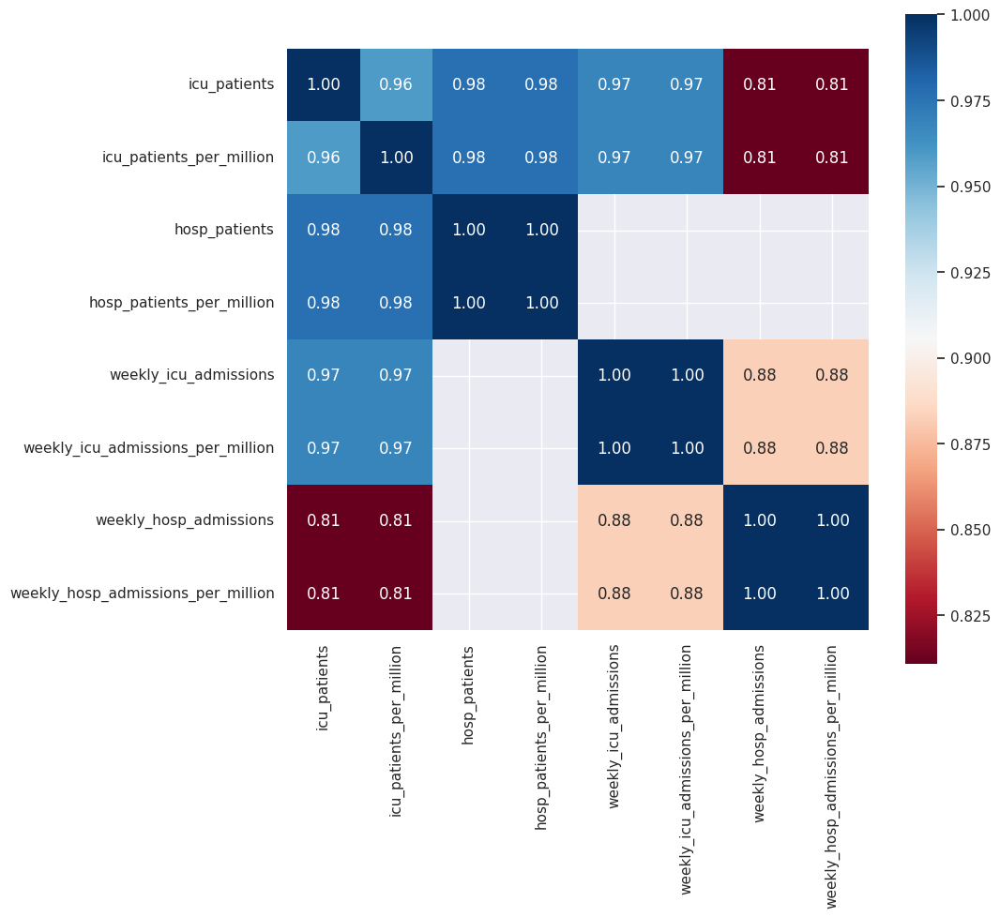

In [84]:
# correlation heatmap
sns.set (rc = {'figure.figsize':(10, 9)})
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

No particularly useful information could be inferred from this correlation map.

#Other conditions

The way a country handles a virus pandemic can be influenced by its political and socioeconomic situation.

Selecting the attributes that will be analyzed in this part of the research.

In [58]:
df_politics = df[['location', 'date','stringency_index','population_density', 'median_age', 'aged_65_older', 'aged_70_older',
                  'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate','diabetes_prevalence', 'female_smokers',
                  'male_smokers','handwashing_facilities', 'hospital_beds_per_thousand','life_expectancy',
                  'human_development_index', 'population']]

### Variables dictionary


* `location`	Geographical location
* `date`	Date of observation
* `aged_65_older` -	Share of the population that is 65 years and older, most recent year available
* `aged_70_older` -	Share of the population that is 70 years and older in 2015
* `cardiovasc_death_rate` -	Death rate from cardiovascular disease in 2017 (annual number of deaths per 100,000 people)
* `diabetes_prevalence` -	Diabetes prevalence (% of population aged 20 to 79) in 2017
* `extreme_poverty` -	Share of the population living in extreme poverty, most recent year available since 2010
* `female_smokers` -	Share of women who smoke, most recent year available
* `gdp_per_capita` -	Gross domestic product at purchasing power parity (constant 2011 international dollars), most recent year available
* `handwashing_facilities` -	Share of the population with basic handwashing facilities on premises, most recent year available
* `hospital_beds_per_thousand` -	Hospital beds per 1,000 people, most recent year available since 2010
* `human_development_index` -	A composite index measuring average achievement in three basic dimensions of human development—a long and healthy life, knowledge and a decent standard of living. Values for 2019, imported from http://hdr.undp.org/en/indicators/137506
* `life_expectancy` -	Life expectancy at birth in 2019
* `male_smokers` -	Share of men who smoke, most recent year available
* `median_age` -	Median age of the population, UN projection for 2020
* `population` -	Population (latest available values).
* `population_density` -	Number of people divided by land area, measured in square kilometers, most recent year available
* `stringency_index` -	Government Response Stringency Index: composite measure based on 9 response indicators including school closures, workplace closures, and travel bans, rescaled to a value from 0 to 100 (100 = strictest response).


















### Data cleaning


**Missing values**

Now we are going to check where exactly in this new Data Frame are the missing or nonvalid data.

In [59]:
# variables sorted by the percentage of their missing values
pd.set_option('display.max_rows', None)
(df_politics.isnull().sum() / df_politics.shape[0]).sort_values(ascending=False)

handwashing_facilities        0.571485
male_smokers                  0.428515
extreme_poverty               0.357096
female_smokers                0.357096
cardiovasc_death_rate         0.142838
stringency_index              0.142838
population_density            0.142838
aged_65_older                 0.142838
gdp_per_capita                0.142838
human_development_index       0.142838
diabetes_prevalence           0.142838
hospital_beds_per_thousand    0.142838
median_age                    0.071419
aged_70_older                 0.071419
life_expectancy               0.000000
location                      0.000000
date                          0.000000
population                    0.000000
dtype: float64

In [60]:
pd.set_option('display.max_rows', 10)

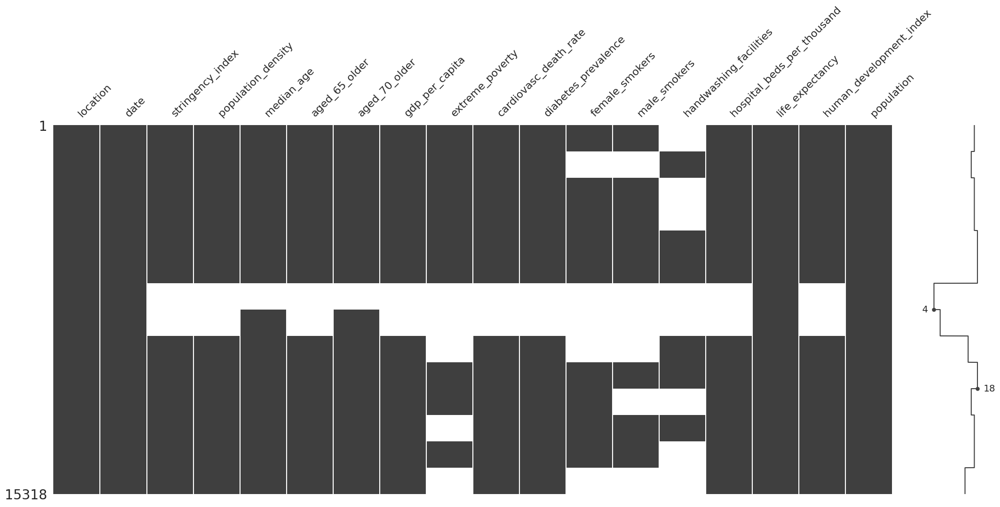

In [61]:
# generates a visualization of the entries with null values
missingno.matrix(df_politics)
plt.show()

In [62]:
# countries with less informatio about the stringency index
df_info = []
for country in df_politics.location.unique():
  df_tmp = df_politics.loc[df_politics['location'] == country]
  null_value = (df_tmp['stringency_index'].isnull().sum() / df_tmp.shape[0])
  df_info.append(
          {
              'Country': country,
              'stringency_index': null_value,
          }
      )

df_info = pd.DataFrame(df_info)
pd.set_option('display.max_rows', 14)
df_info.sort_values('stringency_index', ascending=False, ignore_index=True)

,Country,stringency_index
0,Falkland Islands,1.0
1,French Guiana,1.0
2,Argentina,0.0
3,Bolivia,0.0
4,Brazil,0.0
5,Chile,0.0
6,Colombia,0.0
7,Ecuador,0.0
8,Guyana,0.0
9,Paraguay,0.0


### Time series

At this point, we are going to look into the time series of the data from each country.

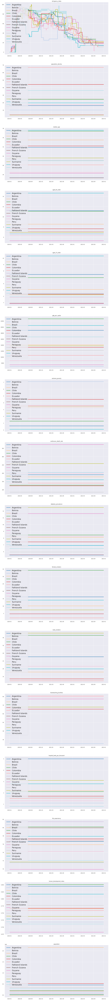

In [63]:
fig, axs = plt.subplots(16, 1, figsize = (20,192)) # adjust the the position of the plots


colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate graphs
i = 0
n = 0
for col in range(2, 18):
  for country in df_politics.location.unique():
    axs[n].plot(df_politics.loc[df_politics['location'] == country].date,
                df_politics.loc[df_politics['location'] == country].iloc[:,[col]],
                label = country, c = colors[i], linewidth=3)
    i+=1
  axs[n].set_title(df_politics.columns[col])
  axs[n].legend(fontsize = 'xx-large', loc = 'upper left')
  i=0
  n+=1

plt.show()

In [64]:
df_info = []

for country in df_politics.location.unique():
  df_tmp = df_politics.loc[df_politics['location'] == country]
  handwashing_facilities = round(sum(df_tmp['handwashing_facilities'])/len(df_tmp['handwashing_facilities']),2)
  male_smokers = round(sum(df_tmp['male_smokers'])/len(df_tmp['male_smokers']),2)
  extreme_poverty = round(sum(df_tmp['extreme_poverty'])/len(df_tmp['extreme_poverty']),2)
  female_smokers = round(sum(df_tmp['female_smokers'])/len(df_tmp['female_smokers']),2)
  cardiovasc_death_rate = round(sum(df_tmp['cardiovasc_death_rate'])/len(df_tmp['cardiovasc_death_rate']),2)
  population = round(sum(df_tmp['population'])/len(df_tmp['population']),2)
  population_density = round(sum(df_tmp['population_density'])/len(df_tmp['population_density']),2)
  aged_65_older = round(sum(df_tmp['aged_65_older'])/len(df_tmp['aged_65_older']),2)
  gdp_per_capita = round(sum(df_tmp['gdp_per_capita'])/len(df_tmp['gdp_per_capita']),2)
  human_development_index = round(sum(df_tmp['human_development_index'])/len(df_tmp['human_development_index']),2)
  diabetes_prevalence = round(sum(df_tmp['diabetes_prevalence'])/len(df_tmp['diabetes_prevalence']),2)
  hospital_beds_per_thousand = round(sum(df_tmp['hospital_beds_per_thousand'])/len(df_tmp['hospital_beds_per_thousand']),2)
  median_age = round(sum(df_tmp['median_age'])/len(df_tmp['median_age']),2)
  aged_70_older = round(sum(df_tmp['aged_70_older'])/len(df_tmp['aged_70_older']),2)
  df_info.append(
          {
              'Country': country,
              'handwashing_facilities': handwashing_facilities,
              'male_smokers': male_smokers,
              'extreme_poverty': extreme_poverty,
              'female_smokers': female_smokers,
              'cardiovasc_death_rate': cardiovasc_death_rate,
              'population': population,
              'population_density': population_density,
              'aged_65_older': aged_65_older,
              'gdp_per_capita': gdp_per_capita,
              'human_development_index': human_development_index,
              'diabetes_prevalence': diabetes_prevalence,
              'hospital_beds_per_thousand': hospital_beds_per_thousand,
              'median_age': median_age,
              'aged_70_older': aged_70_older,
          }
      )

df_info = pd.DataFrame(df_info)
pd.set_option('display.max_rows', 14)
df_info.sort_values('Country', ascending=False, ignore_index=True)

,Country,handwashing_facilities,male_smokers,extreme_poverty,female_smokers,cardiovasc_death_rate,population,population_density,aged_65_older,gdp_per_capita,human_development_index,diabetes_prevalence,hospital_beds_per_thousand,median_age,aged_70_older
0,Venezuela,NaN,NaN,NaN,NaN,204.85,28301700.0,36.25,6.61,16745.02,0.71,6.47,0.80,29.0,3.91
1,Uruguay,NaN,19.9,0.1,14.0,160.71,3422796.0,19.75,14.66,20551.41,0.82,6.93,2.80,35.6,10.36
2,Suriname,67.78,42.9,NaN,7.4,258.31,618046.0,3.61,6.93,13767.12,0.74,12.54,3.10,29.6,4.23
3,Peru,NaN,NaN,3.5,4.8,85.76,34049588.0,25.13,7.15,12236.71,0.78,5.95,1.60,29.1,4.45
4,Paraguay,79.60,21.6,1.7,5.0,199.13,6780745.0,17.14,6.38,8827.01,0.73,8.27,1.30,26.5,3.83
5,Guyana,77.16,NaN,NaN,NaN,373.16,808727.0,3.95,5.31,7435.05,0.68,11.62,1.60,26.3,2.84
6,French Guiana,NaN,NaN,NaN,NaN,NaN,304568.0,NaN,NaN,NaN,NaN,NaN,NaN,25.3,2.90
7,Falkland Islands,NaN,NaN,NaN,NaN,NaN,3801.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Ecuador,80.63,12.3,3.6,2.0,140.45,18001002.0,66.94,7.10,10581.94,0.76,5.55,1.50,28.1,4.46
9,Colombia,65.39,13.5,4.5,4.7,124.24,51874028.0,44.22,7.65,13254.95,0.77,7.44,1.71,32.2,4.31


For instance, **Chile** and **Uruguay** demonstrated impressive rates of testing and vaccinations, which could be attributed to their favorable conditions as they have high GDP per capita (1st and 2nd) and HDI indices (1st and 3rd).

However, **Venezuela**, which has the lowest HDI among the compared countries, reported low rates of cases and deaths. Considering the country's political climate and the lack of significant testing and vaccination data, there is a possibility of underreporting.

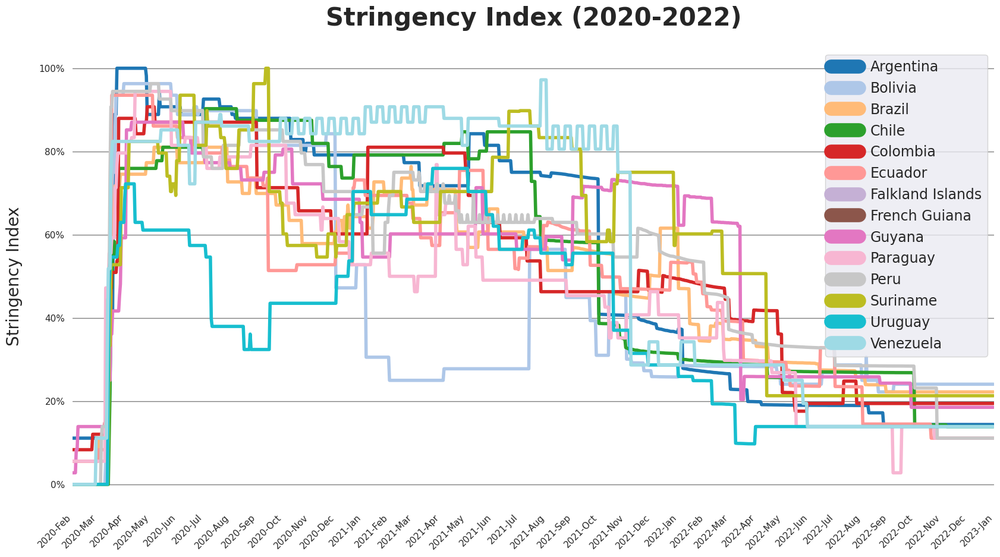

In [65]:
# Plotting the stringency index

fig, ax = plt.subplots(1, 1, figsize = (20,10)) # adjust number and position of plots

colors = plt.cm.tab20(np.linspace(0, 1, 14)) # colors to illustrate each country

i=0 # variable to count during the for loop
custom_lines = []
for country in df_politics.location.unique(): # data that will be ploted
  ax.plot(df_politics.loc[df_politics['location'] == country].date,
              df_politics.loc[df_politics['location'] == country].stringency_index,
              label = country, c = colors[i], linewidth=4)
  custom_lines.append(Line2D([0], [0], color=colors[i], lw=17))
  i+=1

ax.legend(custom_lines, df_cases['location'].unique(), fontsize = 17)

ax.set_title("Stringency Index (2020-2022)", # Title of the plot
             fontsize = 30, weight='bold', verticalalignment='top', y=1.08)


# Text in the x-axis will be displayed in 'YYYY-mm' format.
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%b'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.set_xlim([datetime.date(2020, 2, 1), datetime.date(2023, 1, 1)])

ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{}'.format(int(x)) + '%'))

# label x-axis and y-axis
ax.set_ylabel('Stringency Index', fontsize = '20', labelpad=20)
#ax.set_xlabel('Date', fontsize = 20, labelpad=20)

# Rotates and right-aligns the x labels so they don't crowd each other.
for label in ax.get_xticklabels(which='major'):
  label.set(rotation=45, horizontalalignment='right')

ax.set_facecolor("white")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.yaxis.grid(True, color ="gray")

plt.show()

Looking at the diagram, it's clear that Uruguay's stringency index was consistently lower than the average of other countries for both 2020 and 2022. Similarly, Bolivia had a lower stringency index between January and August 2021.

However, it's important to note that for all countries, including these two, it wasn't possible to determine that these measures have effectively reduced new cases and deaths.

#Coclusions

In [85]:
# correlation of the main attributes
corr_final= df[['total_cases_per_million','new_cases','total_deaths_per_million', 'new_deaths','total_tests','total_boosters_per_hundred', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'stringency_index', 'population_density', 'population', 'human_development_index']].corr(method = 'spearman')

display(corr_final)

,total_cases_per_million,new_cases,total_deaths_per_million,new_deaths,total_tests,total_boosters_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population_density,population,human_development_index
total_cases_per_million,1.000000,0.054577,0.835690,-0.014711,0.798941,0.759328,0.830835,0.780026,-0.680863,-0.062660,0.049651,0.338755
new_cases,0.054577,1.000000,0.216967,0.912831,0.601323,-0.137850,-0.107274,-0.133979,0.354812,0.307762,0.624151,0.353154
total_deaths_per_million,0.835690,0.216967,1.000000,0.176057,0.769743,0.560859,0.639892,0.596539,-0.609583,0.096763,0.294459,0.358425
new_deaths,-0.014711,0.912831,0.176057,1.000000,0.444145,-0.312584,-0.384577,-0.422353,0.450683,0.310430,0.633880,0.342162
total_tests,0.798941,0.601323,0.769743,0.444145,1.000000,0.413541,0.437831,0.379985,-0.311601,0.261484,0.621972,0.410530
total_boosters_per_hundred,0.759328,-0.137850,0.560859,-0.312584,0.413541,1.000000,0.921056,0.945141,-0.794552,0.232603,-0.060391,0.310628
people_vaccinated_per_hundred,0.830835,-0.107274,0.639892,-0.384577,0.437831,0.921056,1.000000,0.962850,-0.744379,0.093348,0.139568,0.477827
people_fully_vaccinated_per_hundred,0.780026,-0.133979,0.596539,-0.422353,0.379985,0.945141,0.962850,1.000000,-0.741466,0.147831,0.013736,0.429645
stringency_index,-0.680863,0.354812,-0.609583,0.450683,-0.311601,-0.794552,-0.744379,-0.741466,1.000000,0.019976,0.061142,-0.012100
population_density,-0.062660,0.307762,0.096763,0.310430,0.261484,0.232603,0.093348,0.147831,0.019976,1.000000,0.629157,0.237606


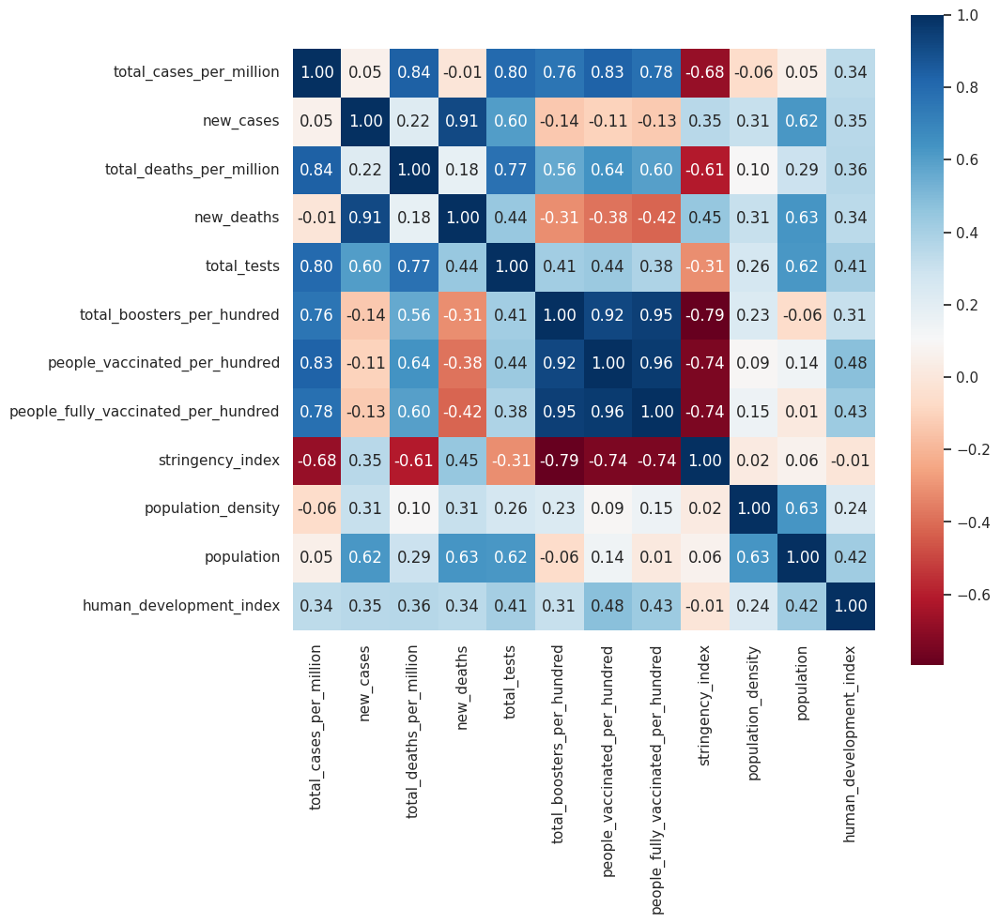

In [86]:
# correlation heatmap
sns.set (rc = {'figure.figsize':(10, 9)})
sns.heatmap(corr_final, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

After studying the development of the COVID-19 pandemic in South America, we could observe some particularities.

There were three main three waves of virus, in the period between 2020 and 2022, that were reflected in the recorded dcases, death, and hospitalization.

It's worth noting that a country's socioeconomic conditions can have a significant impact on the effectiveness of disease control measures, such as testing and vaccination.

Although it is possible to identify some associations and even strong correlations between the variables, it would be necessary to delve into aspects other than statistics so that we could determine causality and promote effective solutions to deal with the problem in question.

Finally, despite its limitations, this research helped to better understand the topic, so that we can be prepared for similar situations in the future (hope doesn't happen again).